In [36]:
#Image(filename='MonashUniversity.png', width=100) 


███╗   ███╗ █████╗  ██████╗██╗  ██╗██╗███╗   ██╗███████╗    ██╗     ███████╗ █████╗ ██████╗ ███╗   ██╗██╗███╗   ██╗ ██████╗ 
████╗ ████║██╔══██╗██╔════╝██║  ██║██║████╗  ██║██╔════╝    ██║     ██╔════╝██╔══██╗██╔══██╗████╗  ██║██║████╗  ██║██╔════╝ 
██╔████╔██║███████║██║     ███████║██║██╔██╗ ██║█████╗      ██║     █████╗  ███████║██████╔╝██╔██╗ ██║██║██╔██╗ ██║██║  ███╗
██║╚██╔╝██║██╔══██║██║     ██╔══██║██║██║╚██╗██║██╔══╝      ██║     ██╔══╝  ██╔══██║██╔══██╗██║╚██╗██║██║██║╚██╗██║██║   ██║
██║ ╚═╝ ██║██║  ██║╚██████╗██║  ██║██║██║ ╚████║███████╗    ███████╗███████╗██║  ██║██║  ██║██║ ╚████║██║██║ ╚████║╚██████╔╝
╚═╝     ╚═╝╚═╝  ╚═╝ ╚═════╝╚═╝  ╚═╝╚═╝╚═╝  ╚═══╝╚══════╝    ╚══════╝╚══════╝╚═╝  ╚═╝╚═╝  ╚═╝╚═╝  ╚═══╝╚═╝╚═╝  ╚═══╝ ╚═════╝ 
                                                                                                                           


#

### ***Importing packages***

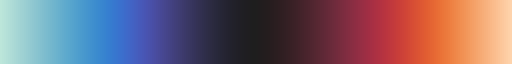

In [37]:
import pandas as pd
import numpy as np
import yfinance as yf

# Plotting libraries
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
%matplotlib inline
from ISLP import load_data
from ISLP.models import (ModelSpec as MS,
                         summarize,
                         poly)

import statsmodels.api as sm
from statsmodels.stats.outliers_influence \
     import variance_inflation_factor as VIF
from statsmodels.stats.anova import anova_lm

from matplotlib.pyplot import subplots
                        
from sklearn.model_selection import train_test_split, KFold, ShuffleSplit, TimeSeriesSplit, cross_val_score, cross_val_predict, cross_validate, GridSearchCV
from sklearn.linear_model import LogisticRegression, LinearRegression, ElasticNet
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA, QuadraticDiscriminantAnalysis as QDA
from sklearn.metrics import accuracy_score, recall_score, precision_score
from sklearn.model_selection import cross_val_score, cross_validate
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import mean_squared_error, r2_score
import pandas as pd
from sklearn.preprocessing import OneHotEncoder, LabelEncoder
# New: feature scaling
from sklearn.preprocessing import StandardScaler

# New: feature profiling
from ydata_profiling import ProfileReport

# New: process streamlining
from sklearn.pipeline import Pipeline

# Model selection
from sklearn.model_selection import (train_test_split,
                                     TimeSeriesSplit,
                                     cross_val_score,
                                     cross_validate,
                                     GridSearchCV)

# Estimators
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier as RFC
                         
from sklearn.ensemble import BaggingClassifier as BC
      
# Evaluation metrics
from sklearn.metrics import accuracy_score, precision_score

# feature scaling
from sklearn.preprocessing import StandardScaler, RobustScaler

# feature profiling
from ydata_profiling import ProfileReport

# process streamlining
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer

# feature selection
from sklearn.feature_selection import SelectFromModel as SFM

import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV, TimeSeriesSplit
from sklearn.metrics import precision_score
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from sklearn.base import clone

import matplotlib.pyplot as plt
from sklearn.neighbors import KNeighborsClassifier
from itertools import combinations
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import precision_score

from sklearn.model_selection import StratifiedKFold


# Technical analysis
import pandas_ta as ta

from IPython.display import Image
%matplotlib inline

# backtesting
import pyfolio as pf

# Turn off warnings
import warnings
warnings.filterwarnings('ignore')

mpl.rcParams['font.family'] = 'Segoe UI'
mpl.rcParams['figure.figsize'] = [10.0, 4.0]
mpl.rcParams['font.size'] = 7
mpl.rcParams['lines.linewidth'] = 2 
sns.color_palette("icefire", as_cmap=True)

###

### **This notebook is broken down into the following sections**
1. Problem statement
2. Data collection
3. Data preprocessing
4. Algorithm selection
5. Model training and selection
6. Model evaluation

###

***
# **1. Problem Statement:**

###

This machine learning project aims to develop a binary classification model to predict positive short-term (weekly) stock price movements (positive weekly return) for BHP (ASX:BHP). Our objective is to develop a model that has an economically viable predictive ability with respect to forming an investment strategy based on the models predictions, such that a trading strategy based on this model would generate a positive return over the back test in addition outperforming the underlying stock over the test period.


***
# **2. Data Collection** 


###

We begin by downloading the BHP stock price data using `yfinance` from the 31st of december 2014 to the present date; the second of October 2024.

In [38]:
stocklist = ['BHP.AX']
start = '2014-12-30'
end = '2024-10-02'

stock_data = yf.download(stocklist, start, end, interval = '1d', ignore_tz = True, progress=False).dropna()
observations = stock_data.shape[0]

print(f'Data contains {observations} days of stock prices.')

Data contains 2471 days of stock prices.


###

**Below we plot BHP's stock price over the sample period:**

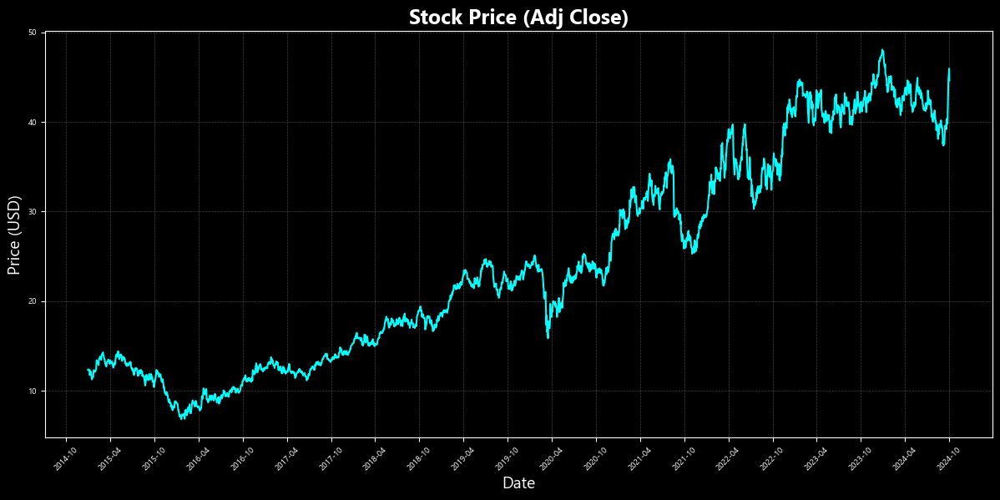

In [39]:
plt.style.use('dark_background')

fig, ax = plt.subplots(figsize=(12, 6))
ax.plot(stock_data.index, stock_data['Adj Close'], color='cyan', linewidth=1.5)

ax.set_title('Stock Price (Adj Close)', fontsize=18, color='white', weight='bold')
ax.set_xlabel('Date', fontsize=14, color='white')
ax.set_ylabel('Price (USD)', fontsize=14, color='white')

ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(color='white', rotation=45)
plt.yticks(color='white')

ax.grid(visible=True, color='gray', linestyle='--', linewidth=0.5, alpha=0.5)

ax.spines['top'].set_color('white')
ax.spines['right'].set_color('white')
ax.spines['bottom'].set_color('white')
ax.spines['left'].set_color('white')

plt.tight_layout()
plt.show(block=True)

###

**Ensure days are aligned for the purpose of resampling to weekly values**

In [40]:
stock_data.index.day_name()

Index(['Tuesday', 'Wednesday', 'Friday', 'Monday', 'Tuesday', 'Wednesday',
       'Thursday', 'Friday', 'Monday', 'Tuesday',
       ...
       'Wednesday', 'Thursday', 'Friday', 'Monday', 'Tuesday', 'Wednesday',
       'Thursday', 'Friday', 'Monday', 'Tuesday'],
      dtype='object', name='Date', length=2471)

*As we can see above, both the starting day and ending day fall on a Tuesday which will support resampling to weekly values.*

In [41]:
# Define a dictionary with the functions to apply to each column
functions = {
    "Open": "first", 
    "High": "max",
    "Low": "min", 
    "Close": "last", 
    "Adj Close": "last", 
    "Volume": "sum"
    }

# Resample to weekly intervals between each date
bhp_wk = stock_data.resample('W-TUE').aggregate(functions)
bhp_wk

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2014-12-30,24.719727,24.761328,24.353632,24.528358,12.354544,6794279
2015-01-06,24.453476,24.636522,23.213745,23.388472,11.780402,25246872
2015-01-13,23.338551,24.270428,23.172144,23.271988,11.721729,40562362
2015-01-20,23.197104,23.563198,22.048899,22.864290,11.516381,62445427
2015-01-27,23.213745,24.578281,23.147182,24.087381,12.132430,38060809
...,...,...,...,...,...,...
2024-09-03,40.869999,41.189999,39.630001,39.630001,38.511833,46461812
2024-09-10,38.880001,39.189999,38.279999,38.660000,37.569202,41215399
2024-09-17,38.750000,39.865002,38.455002,39.549999,39.549999,42694651


###

***
## **Classifying the response variable**

*Binary classification of a `positive` weekly return*

In time series predictions like this case, for each observation at time $t$, features are the predictors observed up to and including time $t$, and the response is the outcome at $t+1$.

We require the price to increase more than a threshold $h$ to qualify as an up move to account for trading costs $h = 0.2\%$, such that a positive weekly return (increase in stock price over a given week) is classified as '1' where the return is positive and exceeds 0.2%.


$$y_t = \begin{cases} 
1,\hspace{0.5cm} \text{if } p_{t+1} > (1 + h)p_t
\\0, \hspace{0.5cm} \text{if } p_{t+1} \leq (1 + h)p_t
\end{cases}$$

**The target variable is defined below:**

In [42]:
# Define target variable
return_threshold = 0.02  #ie. 0.2% - set equal to transaction costs

bhp_wk['Up'] = np.where(bhp_wk['Adj Close'].shift(-1) > (1 + return_threshold)*bhp_wk['Adj Close'], 1, 0)
bhp_wk['Up']

Date
2014-12-30    0
2015-01-06    0
2015-01-13    0
2015-01-20    1
2015-01-27    1
             ..
2024-09-03    0
2024-09-10    1
2024-09-17    1
2024-09-24    1
2024-10-01    0
Freq: W-TUE, Name: Up, Length: 510, dtype: int32

#

***
# **Data collection and construction of predictor sets**

**We construct ten predictor sets which can be broken down into the following categories:**
1. News Adjusted Beta
2. Intra-day range
3. Technical Indicators
4. Peer returns
5. Commodity Futures
6. Market sensitive announcements
7. Analyst reccomendations
8. FX pairs
9. Dividend month premium
10. Short term reversal

###

***
 ### **Constructing feature Set x1:**

`Macro-news adjusted Rolling Beta`

## $Beta_{c} = correlation_{(BHP,market)}\frac{std_{BHP}}{std_{market}}$

*where:*

$c = \text{country}$

$$
C = 
\begin{cases} 
\text{Australia}, & \text{market proxy} = \text{AORD}_{t} \\
\text{China}, & \text{market proxy} = \text{SSI Composite}_{t} 
\end{cases}
$$


***
###

**We first estimate the 1-year rolling Australian Beta**

Note: Assumed 252 trading days per year

In [43]:
# define the tickers of the target variable and market proxy
tickers = ['BHP.AX', '^AORD']

# Note: we require data from '2014-12-30' less the size of the rolling window to avoid reducing our sample size
aus_index_data = yf.download(tickers, start='2013-12-30', end = '2024-10-02', progress = False, ignore_tz = True)['Adj Close']

# convert daily prices to daily returns
aus_index_ret = aus_index_data.pct_change()

# rolling correlation 
roll_corr = aus_index_ret['BHP.AX'].rolling(window=252).corr(aus_index_ret['^AORD'])

# rolling standard deviation and beta calculaion
aus_index_std = aus_index_ret.rolling(window=252).std()
aus_index_beta = roll_corr*(aus_index_std['BHP.AX']/aus_index_std['^AORD'])

###

**Plotting the Aus rolling beta values**

Please note that this graph was added after feature construction and sample period slection - there was no indirect data leakage due to human sampling bias 

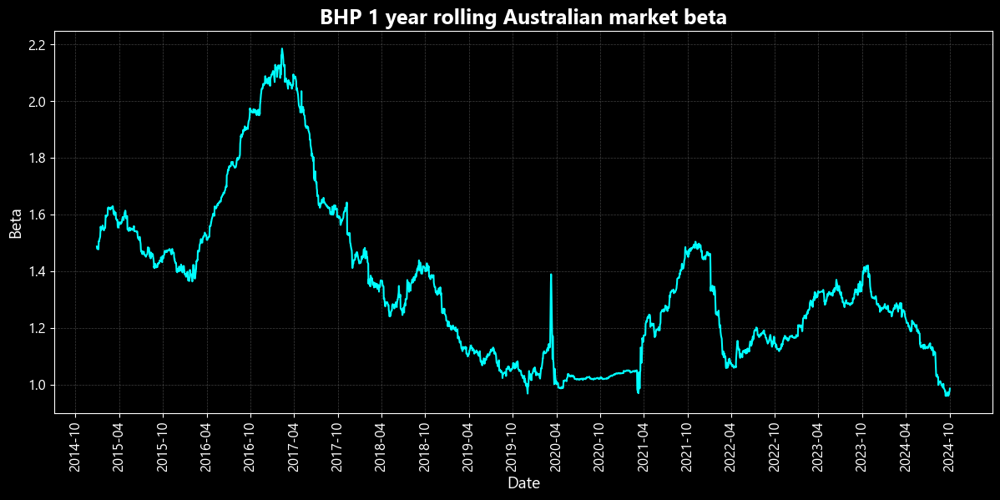

In [44]:
fig, ax = plt.subplots(figsize=(12, 6))
ax.plot(aus_index_beta.index, aus_index_beta, color='cyan', linewidth=1.5)

ax.set_title('BHP 1 year rolling Australian market beta', fontsize=18, color='white', weight='bold')
ax.set_xlabel('Date', fontsize=14, color='white')
ax.set_ylabel('Beta', fontsize=14, color='white')

ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(color='white', rotation=90, fontsize=12)
plt.yticks(color='white', fontsize=12)

ax.grid(visible=True, color='gray', linestyle='--', linewidth=0.5, alpha=0.5)

ax.spines['top'].set_color('white')
ax.spines['right'].set_color('white')
ax.spines['bottom'].set_color('white')
ax.spines['left'].set_color('white')

plt.tight_layout()
plt.show(block=True)

From the chart above, we observe significant variance in the Ausralian 1-year beta value over the sample period. The beta reaches a maximum (~2.2) at the start of 2017 and highlights a general degree of cyclicality over the sample period. Forunately, this sample approximates what seems to be a single market cycle, although the impact of COVID-19 likely have a distortive effect which can be seen in 2021 (1-year lag). There is also a sudden out of character spike prior to april 2020 which immediately retraces to the prior level.

###

**We now import Australian macroeconomic news data in a csv file sourced from Bloomberg**

*Source: https://www.bloomberg.com/markets/economic-calendar*

Note: the csv contains a list of dates on which an economic data release occured (ie. Inflation or GDP statistic released) and a corresponding column containing the number 1

In [45]:

#importing data from csv file
aus_news = pd.read_csv(r"C:\Users\PRECISION01\BFF5555\Data\Aus-macronews-dates.csv", index_col = "Date", na_values ='?')
aus_news.dropna(inplace = True)
aus_news.index = pd.to_datetime(aus_news.index, format='%m/%d/%Y')
aus_news = aus_news.groupby(aus_news.index).sum()

aus_news.head(5)

,Class
Date,
2014-10-14,1
2014-10-15,1
2014-11-04,1
2014-11-11,1
2014-11-12,1


In [46]:

#localising the dates to ensure the index values are aligned
aus_news.index = aus_news.index.tz_localize(None)
aus_index_beta.index = aus_index_beta.index.tz_localize(None)

#merging the dataframes to allow for matrix multiplication
news_beta = pd.concat([aus_index_beta, aus_news], axis = 1)

# replace NA values with 0 
news_beta = news_beta.fillna(0.0)
news_beta.tail(5)


,0,Class
Date,,
2024-09-26,0.965267,0.0
2024-09-27,0.965560,0.0
2024-09-30,0.977690,0.0
2024-10-01,0.985704,0.0
2024-10-03,0.000000,1.0


We then multiply the news beta column with the class column. This is possible since the class column was imported containing floating point numbers.

In [47]:
# separate the two dataframes
news = news_beta['Class']

# perform matrix multiplication
aus = (news * aus_index_beta)

# reduce the size of the dataframe to our observation window
aus = aus.loc['2014-12-31':]

###

### We then follow the same process to estimate the rolling Chinese market Beta

In [48]:
tickers = ['BHP.AX', '000001.SS']

chn_index_data = yf.download(tickers, start='2013-12-30', end = '2024-10-04', progress = False, ignore_tz = True)['Adj Close']

chn_index_ret = chn_index_data.pct_change()

roll_corr = chn_index_ret['BHP.AX'].rolling(window=252).corr(chn_index_ret['000001.SS'])

chn_index_std = chn_index_ret.rolling(window=252).std()
chn_index_beta = roll_corr*(chn_index_std['BHP.AX']/chn_index_std['000001.SS'])

### **Plotting results:**

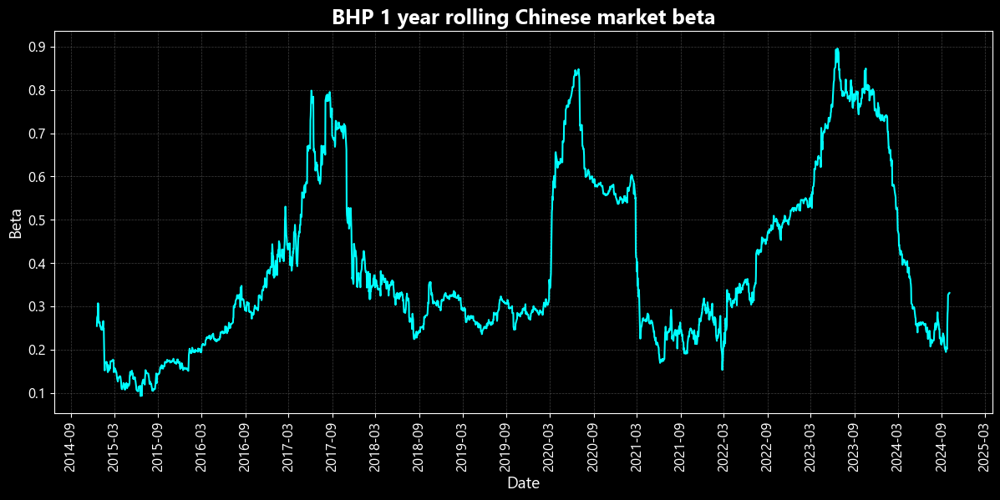

In [49]:
fig, ax = plt.subplots(figsize=(12, 6))
ax.plot(chn_index_beta.index, chn_index_beta, color='cyan', linewidth=1.5)

ax.set_title('BHP 1 year rolling Chinese market beta', fontsize=18, color='white', weight='bold')
ax.set_xlabel('Date', fontsize=14, color='white')
ax.set_ylabel('Beta', fontsize=14, color='white')

ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(color='white', rotation=90, fontsize=12)
plt.yticks(color='white', fontsize=12)

ax.grid(visible=True, color='gray', linestyle='--', linewidth=0.5, alpha=0.5)

ax.spines['top'].set_color('white')
ax.spines['right'].set_color('white')
ax.spines['bottom'].set_color('white')
ax.spines['left'].set_color('white')

plt.tight_layout()
plt.show(block=True)

In [50]:
china_news = pd.read_csv(r"C:\Users\PRECISION01\BFF5555\Data\China-macronews-dates.csv", index_col = "Dates", na_values ='?')
china_news.dropna(inplace = True)
china_news.index = pd.to_datetime(china_news.index, format='%m/%d/%Y')
china_news = china_news.groupby(china_news.index).sum()

china_news.index = china_news.index.tz_localize(None)
aus_index_beta.index = aus_index_beta.index.tz_localize(None)

news_beta = pd.concat([aus_index_beta, china_news], axis = 1)
news_beta = news_beta.fillna(0.0)

news = news_beta['Class']
china = (news * aus_index_beta)
china = china.loc['2014-12-31':]
china.tail(5)

2024-09-25    0.00000
2024-09-26    0.00000
2024-09-27    0.00000
2024-09-30    0.97769
2024-10-01    0.00000
dtype: float64

###

### Both Chinese and Australian news adjusted betas are combined into a single dataframe: **x1**

In [51]:
x1 = pd.concat([aus, china], axis = 1)
x1.columns = ['china_beta', 'aus_beta']
x1 = x1.resample('W-TUE').mean().dropna()
x1.tail(4)

,china_beta,aus_beta
2024-09-10,0.594932,0.392509
2024-09-17,0.000000,0.000000
2024-09-24,0.193152,0.000000
2024-10-01,0.192048,0.195538


# now we create the market index returns

In [52]:
# Concatenate only one column from each DataFrame, ensuring there are two columns in total
index_ret = pd.concat([chn_index_ret.iloc[:, 0], aus_index_ret.iloc[:, 0]], axis=1)
index_ret.columns = ['china', 'australia']
index_ret.index = index_ret.index.tz_localize(None)

# Align indices and calculate the excess returns
aus_df = pd.concat([x1['aus_beta'], index_ret['australia']], axis=1)
chn_df = pd.concat([x1['china_beta'], index_ret['china']], axis=1)

aus_df.columns = ['beta', 'market_ret']
chn_df.columns = ['beta', 'market_ret']

aus_exret = aus_df['beta'] * aus_df['market_ret']
china_exret = chn_df['beta'] * chn_df['market_ret']

# Clear contents of x1
x1 = pd.DataFrame()

# Concatenate the excess returns and set the column names
x1 = pd.concat([aus_exret, china_exret], axis=1).dropna()
x1.columns = ['aus_exret', 'chn_exret']

# Display the first 5 rows of the resulting DataFrame
x1.head(5)

,aus_exret,chn_exret
2015-01-06,-0.000000,0.000104
2015-01-13,-0.005727,0.000000
2015-01-20,-0.000000,0.000000
2015-01-27,-0.000000,-0.006915
2015-02-03,0.000000,0.007693


In [53]:
x1.index = pd.to_datetime(x1.index)
#x1.index = x1.index.tz_localize(None)

###

***
## *2. Constructing feature set x2*

`Intra-day range`

In [54]:
# intra day range
x2 = pd.concat([np.log(bhp_wk['High'] / bhp_wk['Low']), np.log(bhp_wk['Open'] / bhp_wk['Close'])], axis = 1)
x2.columns = ['HL', 'OC']

###

***
## *3. Constructing feature set x3*
`Technical Indicators`

- BBL_4_2.0 (Bollinger Band Lower)
- BBM_4_2.0 (Bollinger Band Middle)
- BBU_4_2.0 (Bollinger Band Upper)
- BBB_4_2.0 (Bollinger Band Width)
- BBP_4_2.0 (Bollinger Band %B) - *position relative to the other bands*



Technical indicators are not a personal point of interest however, there may be value found in diversifying the predictor set. There's a good chance that all other predictor sets slected are based on my own preconcieved ideas and thought patterns. I decided to leave these technical indicators untouched. If I attempted to rationalise their inclusion and therby introduced the possibility of their exclusion, I would loose this value of diversity.

In [55]:

MyStrategy = ta.Strategy(
    name="Momentum and Volatility",
    description="SMA 50,200, BBANDS, RSI, MACD and Volume SMA 20",
    ta=[
        {"kind": "sma", "length": 40},
        {"kind": "bbands", "length": 4},
        {"kind": "sma", "close": "volume", "length": 4, "prefix": "VOLUME"},
    ]
)

# The parameters are adjusted to suit weekly sampling
bhp2 = bhp_wk.copy()
bhp2.ta.strategy(MyStrategy)

x3 = bhp2.drop(bhp_wk.columns, axis = 1)
x3.tail(3)

,SMA_40,BBL_4_2.0,BBM_4_2.0,BBU_4_2.0,BBB_4_2.0,BBP_4_2.0,VOLUME_SMA_4
Date,,,,,,,
2024-09-17,44.12375,37.849816,39.797500,41.745183,9.787969,0.436463,41399144.0
2024-09-24,43.91125,37.973931,39.740000,41.506068,8.888115,0.890698,45344920.0
2024-10-01,43.78400,36.427209,40.992499,45.557789,22.273782,0.899482,51761997.5


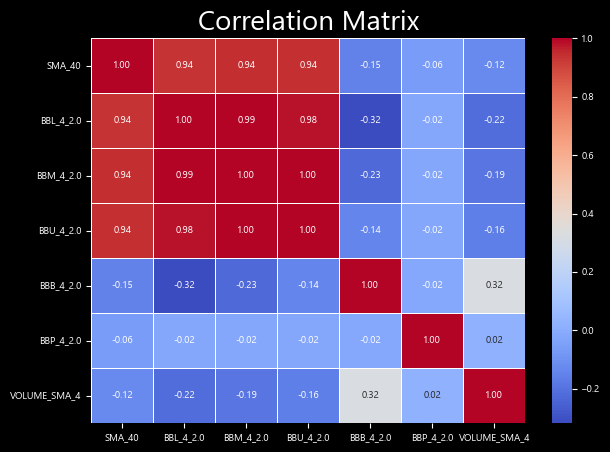

In [56]:
# checking correlations
plt.figure(figsize=(7, 5))
corr_matrix = x3.corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix', fontsize=20)
plt.show()

Note that since BBP_4_2.0 (Bollinger Band %B) - indicates the current price position relative to the other bands, there is a significant overlap in the information presented. To avoid multicoliniarity,
only BBP will be used in the feature set. As expected, the bollinger band ranges are significantly correlated with one another. To address the multicolineariy issue we exclude the irrelevant data:

In [57]:
x3 = x3[['BBP_4_2.0','SMA_40', 'VOLUME_SMA_4']]
x3.tail(3)

,BBP_4_2.0,SMA_40,VOLUME_SMA_4
Date,,,
2024-09-17,0.436463,44.12375,41399144.0
2024-09-24,0.890698,43.91125,45344920.0
2024-10-01,0.899482,43.78400,51761997.5


###

Below we check the distribution of the data:

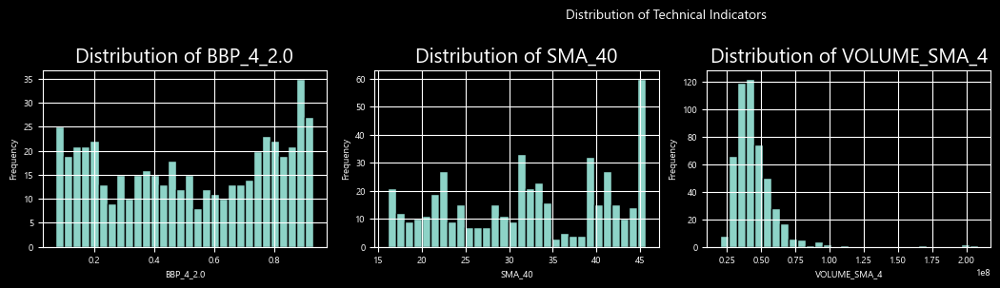

In [58]:

num_columns = ['BBP_4_2.0', 'SMA_40', 'VOLUME_SMA_4']

ncols = 4
nrows = (len(num_columns) // ncols) + (len(num_columns) % ncols > 0)
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(14, 3))

axes = axes.flatten()

for i, col in enumerate(num_columns):
    x3[col].hist(ax=axes[i], bins=30, edgecolor='black')
    axes[i].set_title(f'Distribution of {col}', fontsize=15)
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Frequency')

for j in range(i + 1, nrows * ncols):
    fig.delaxes(axes[j])

plt.suptitle('Distribution of Technical Indicators', fontsize=10)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show(block=True)

from the graph above, we can see that the features will need to be scaled or encoded due to their non-normal distribution and varying scale's. Both BBP_4_2.0 will be scaled via normalisation within the ML pipeline. Note that standardisation does not transform non-normally distributed data into normally distributed data. We therefore need to transform the data on a logarithmic scale which we will lump together after all features have been constructed.

###

## *4. Constructing feature set x4*

`Peer returns`

In [59]:
tickers = ['FMG.AX', 'RIO.AX']

# start/end = defined when downloading target variable data

x4 = pd.DataFrame()
for ticker in tickers:
    peer = yf.download(ticker, start, end, ignore_tz = True, progress=False)
    peer = peer.resample('W-WED').aggregate(functions)
    x = np.log(peer[['Adj Close']]).diff()
    x.columns = ['Ret_' + ticker]
    x4 = pd.concat([x4, x], axis = 1)

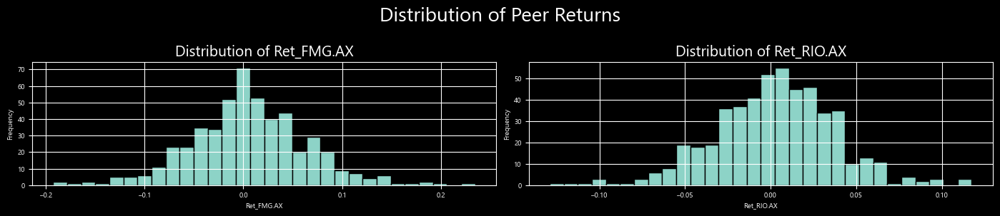

In [60]:
num_columns = x4.columns

ncols = 2
nrows = (len(num_columns) // ncols) + (len(num_columns) % ncols > 0)
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(14, 3))

axes = axes.flatten()

for i, col in enumerate(num_columns):
    x4[col].hist(ax=axes[i], bins=30, edgecolor='black')
    axes[i].set_title(f'Distribution of {col}', fontsize=15)
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Frequency')

for j in range(i + 1, nrows * ncols):
    fig.delaxes(axes[j])

plt.suptitle('Distribution of Peer Returns', fontsize=20)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show(block=True)

At this stage, the distributions look approximately normal - RIO's are a touch skewed but no alarming issues to address.

###

## *5. Constructing feature set x5*
`Commodity Futures`

In [61]:
commodities = {   
    
    'GC=F': 'Gold',
    'TIO=F': 'Iron Ore',
    'HG=F': 'Copper'
    }

# start/end = defined when downloading target variable data

data = yf.download(list(commodities.keys()), start=start, end=end, group_by="ticker", auto_adjust=True, ignore_tz = True, progress=False)

commodity_data = pd.DataFrame()

for ticker in commodities.keys():
    commodity_data[commodities[ticker]] = data[ticker]['Close']


x5 = np.log(commodity_data).diff().dropna()
x5 = x5.resample('W-TUE').mean()


### Plotting distributions:

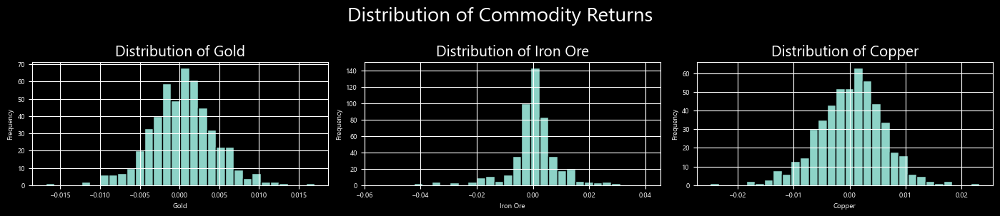

In [62]:
num_columns = x5.columns

ncols = 3
nrows = (len(num_columns) // ncols) + (len(num_columns) % ncols > 0)
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(14, 3))

axes = axes.flatten()

for i, col in enumerate(num_columns):
    x5[col].hist(ax=axes[i], bins=30, edgecolor='black')
    axes[i].set_title(f'Distribution of {col}', fontsize=15)
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Frequency')

for j in range(i + 1, nrows * ncols):
    fig.delaxes(axes[j])

plt.suptitle('Distribution of Commodity Returns', fontsize=20)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show(block=True)

Gold & Copper approximately normally distributed, Iron ore is highly centered around the mean

###

## *6. Constructing feature set x6*
`Market Sensative Announcements`

In [63]:
#importing BHP_announcement data from csv file
announcement_data = pd.read_csv(r"C:\Users\PRECISION01\BFF5555\Data\BHP_Announcements.csv", index_col='Date')
announcement_data.index = pd.to_datetime('1899-12-30') + pd.to_timedelta(announcement_data.index, 'D')
announcement_data.index = announcement_data.index.strftime('%Y-%m-%d')

announcement_data['Hour'] = pd.to_datetime(announcement_data['Time']).dt.hour #didnt use but could be interesting to explore the time of release 

announcement_data['Is_Earnings_Report'] = announcement_data['Description'].str.contains('Results', case=False).astype(int)
announcement_data['Is_Quarterly_Report'] = announcement_data['Description'].str.contains('Quarterly', case=False).astype(int)

announcement_data['Earnings_Report_length'] = announcement_data['Is_Earnings_Report']*announcement_data['N_pages']
announcement_data['Quarterly_Report_length'] = announcement_data['Is_Quarterly_Report']*announcement_data['N_pages']
announcement_data = announcement_data.drop(columns={"Time", "Description","Hour","N_pages"})
#announcement_data[['Is_Earnings_Report', 'Is_Quarterly_Report']] = announcement_data[['Is_Earnings_Report', 'Is_Quarterly_Report']].astype('category')

x6 = announcement_data.groupby(announcement_data.index).agg({'Is_Earnings_Report':'max','Is_Quarterly_Report':'max', 'Earnings_Report_length':'sum', 'Quarterly_Report_length':'sum'})


# create the index benchmark
date_bm = stock_data['Low']

x6 = pd.concat([date_bm, x6], axis = 1)
x6 = x6.drop(columns = 'Low')
x6 = x6.fillna(0.0)
x6.index = pd.to_datetime(x6.index)
x6 = x6.groupby(x6.index).agg({'Is_Earnings_Report':'max','Is_Quarterly_Report':'max', 'Earnings_Report_length':'sum', 'Quarterly_Report_length':'sum'})
x6 = x6.resample('W').sum()


x6 = x6.loc['2014-12-28':end]

x6.head(5)


,Is_Earnings_Report,Is_Quarterly_Report,Earnings_Report_length,Quarterly_Report_length
Date,,,,
2014-12-28,0.0,0.0,0.0,0.0
2015-01-04,0.0,0.0,0.0,0.0
2015-01-11,0.0,0.0,0.0,0.0
2015-01-18,0.0,0.0,0.0,0.0
2015-01-25,0.0,0.0,0.0,0.0


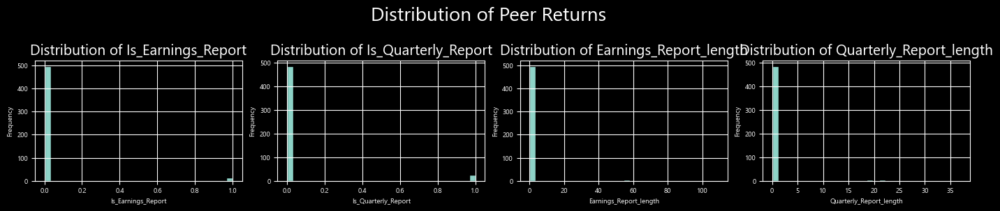

In [64]:
num_columns = x6.columns

ncols = 4
nrows = (len(num_columns) // ncols) + (len(num_columns) % ncols > 0)
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(14, 3))

axes = axes.flatten()

for i, col in enumerate(num_columns):
    x6[col].hist(ax=axes[i], bins=30, edgecolor='black')
    axes[i].set_title(f'Distribution of {col}', fontsize=15)
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Frequency')

for j in range(i + 1, nrows * ncols):
    fig.delaxes(axes[j])

plt.suptitle('Distribution of Peer Returns', fontsize=20)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show(block=True)

we note that these variables need to be dtype=category, we will adjust all features in need of 'categorising' in one go.

###

## *7. Constructing feature set x7*
`Analyst Reccomendations`

In [65]:
BHP_ticker = yf.Ticker("BHP") # note that this is the US listing of BHP stock as the ASX tic has no coverage
analyst_recommendations = BHP_ticker.upgrades_downgrades
analyst_recommendations.index = pd.to_datetime(analyst_recommendations.index).date

# Rating Change
ratings = pd.DataFrame()

ratings['broker_upgrades'] = analyst_recommendations['Action']
ratings['broker_upgrades'] = np.where(ratings['broker_upgrades'] == 'up', 1, 0)

ratings['broker_downgrades'] = analyst_recommendations['Action']
ratings['broker_downgrades'] = np.where(ratings['broker_downgrades'] == 'down', 1, 0)

x7 = ratings.groupby(ratings.index).agg({'broker_upgrades': 'sum', 'broker_downgrades': 'sum'})

cols = ['broker_upgrades', 'broker_downgrades'] 

for col in cols:
    x7[col] = np.where(pd.isna(x7[col]), 0, x7[col])




# create the index benchmark
date_bm = stock_data['Low']

x7 = pd.concat([date_bm, x7], axis = 1)
x7 = x7.drop(columns = 'Low')
x7 = x7.fillna(0.0)
x7.index = pd.to_datetime(x7.index)
x7 = x7.groupby(x7.index).agg({'broker_upgrades':'sum','broker_downgrades':'sum'})
x7 = x7.resample('W').sum()


x7 = x7.loc['2014-12-28':end]
x7.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 510 entries, 2014-12-28 to 2024-09-29
Freq: W-SUN
Data columns (total 2 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   broker_upgrades    510 non-null    float64
 1   broker_downgrades  510 non-null    float64
dtypes: float64(2)
memory usage: 12.0 KB


#

## *8. Constructing feature set x8*
`FX Pairs`

In [66]:
FX_pairs = ['AUDUSD=X', 'CADUSD=X', 'CLPUSD=X', 'GBPUSD=X', 'EURUSD=X']

# start/end = defined when downloading target variable data

x8 = yf.download(FX_pairs, start=start, end=end, interval='1d', ignore_tz=True, progress=False)['Adj Close']

x8.index = pd.to_datetime(x8.index)

x8 = x8.resample('W-Wed').mean()

x8 = np.log(x8).diff()

x8.head(3)

Ticker,AUDUSD=X,CADUSD=X,CLPUSD=X,EURUSD=X,GBPUSD=X
Date,,,,,
2014-12-31 00:00:00+00:00,NaN,NaN,NaN,NaN,NaN
2015-01-07 00:00:00+00:00,-0.005031,-0.008513,-0.007971,-0.013914,-0.011265
2015-01-14 00:00:00+00:00,0.003438,-0.013540,-0.006262,-0.014048,-0.014632


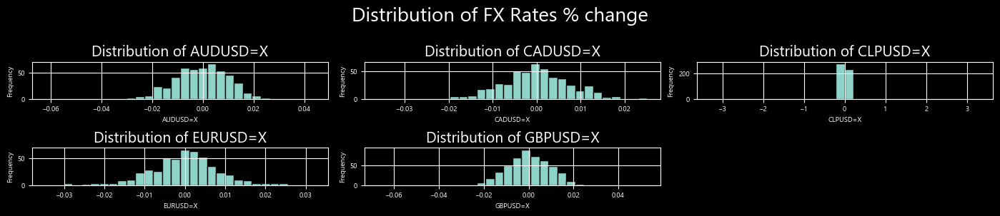

In [67]:
num_columns = x8.columns

ncols = 3
nrows = (len(num_columns) // ncols) + (len(num_columns) % ncols > 0)
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(14, 3))

axes = axes.flatten()

for i, col in enumerate(num_columns):
    x8[col].hist(ax=axes[i], bins=30, edgecolor='black')
    axes[i].set_title(f'Distribution of {col}', fontsize=15)
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Frequency')

for j in range(i + 1, nrows * ncols):
    fig.delaxes(axes[j])

plt.suptitle('Distribution of FX Rates % change', fontsize=20)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show(block=True)

### There is an abnormality with CLPUSD=X, lets take a closer look:

In [68]:
x8['CLPUSD=X']

Date
2014-12-31 00:00:00+00:00         NaN
2015-01-07 00:00:00+00:00   -0.007971
2015-01-14 00:00:00+00:00   -0.006262
2015-01-21 00:00:00+00:00   -0.018229
2015-01-28 00:00:00+00:00    0.003139
                               ...   
2024-09-04 00:00:00+00:00   -0.005955
2024-09-11 00:00:00+00:00   -0.029486
2024-09-18 00:00:00+00:00    0.013891
2024-09-25 00:00:00+00:00    0.006880
2024-10-02 00:00:00+00:00    0.023318
Freq: W-WED, Name: CLPUSD=X, Length: 510, dtype: float64

**Varied returns, but will need to ensure we scale the data to account for the difference in unit variance. Given all pairs contain USD as their base pair, theres likely to be a high degree of multicolinearinty. We check as follows:**

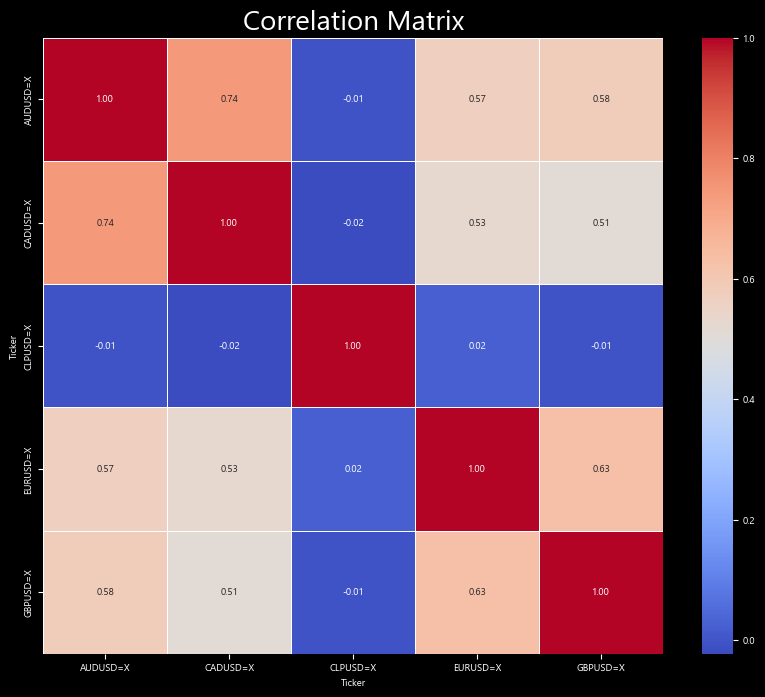

In [69]:
# checking correlations
plt.figure(figsize=(10, 8))
corr_matrix = x8.corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix', fontsize=20)
plt.show()

**Notably high degree of correlation between CAD and AUD pairs. We will also adjust for this down the line.**

#

### *9. Constructing feature Set x9*
`Dividend month premium`

In [70]:
stocklist = ['BHP.AX']

# start/end = defined when downloading target variable data

dividend = yf.download(stocklist, start, end, interval='1wk', actions=True, progress=False) #actions = true includes dividends + splits


for i in range(1, 5):
    dividend[f'{i}_week(s)_until_div'] = (dividend['Dividends'].shift(-i) > 0).astype(int)

x9 = dividend.drop(columns={'Open','High','Low','Close','Adj Close','Volume','Stock Splits'})


# define the date_index benchmark - could have picked any column
date_bm = stock_data['Low'] 

# merge and drop to create a reindexed df
x9 = pd.concat([date_bm, x9], axis = 1)
x9 = x9.drop(columns = 'Low')
x9 = x9.fillna(0.0)

x9.index = pd.to_datetime(x9.index)
x9 = x9.groupby(x9.index).sum()
x9 = x9.resample('W').sum()


x9 = x9.loc['2014-12-28':end]
x9

,Dividends,1_week(s)_until_div,2_week(s)_until_div,3_week(s)_until_div,4_week(s)_until_div
Date,,,,,
2015-01-04,0.000000,0.0,0.0,0.0,0.0
2015-01-11,0.000000,0.0,0.0,0.0,0.0
2015-01-18,0.000000,0.0,0.0,0.0,0.0
2015-01-25,0.000000,0.0,0.0,0.0,0.0
2015-02-01,0.000000,0.0,0.0,0.0,0.0
...,...,...,...,...,...
2024-09-01,0.000000,0.0,1.0,0.0,0.0
2024-09-08,0.000000,1.0,0.0,0.0,0.0
2024-09-15,1.109986,0.0,0.0,0.0,0.0


#

## *10. Constructing feature set x10*
`Short term reversal`

For context, this code first downloads a pre-pended '.AX' list of the ASX300 tickers sourced from: https://www.marketindex.com.au/asx300

This list will serve as a market proxy for calculating the market return distribution.

It then loops through each of the constituents in the ASX300 list and downloads the stock price data, resamples the data in the same way as we did with the target variable, converts to weekly returns and adds to the market_ret dataframe. 

This allows us to calculate the percentile of BHP's returns during each week. We then construct two features:

1. reversal_down
2. reversal _up

These classes are intuitive when considering them as indicators of price movements in the following period (down = price goes down and therefore a negative return)

The feature `reversal_down` is set = 1 where the returns in the previous week are in the top decile, all else = 0

The feature `reversal_up` is set = 1 where the returns in the previous week are in the bottom decile, all else = 0

In [71]:
A300 = pd.read_csv(r"C:\Users\PRECISION01\BFF5555\Data\A300 tickers.csv", header=None)
A300.dropna(inplace=True)

# start/end = defined when downloading target variable data

market_ret = pd.DataFrame()  

functions = {
    "Open": "first", 
    "High": "max",
    "Low": "min", 
    "Close": "last", 
    "Adj Close": "last", 
    "Volume": "sum"
    }

for ticker in A300[0]:
    try:
        constituent_data = yf.download(ticker, start, end, ignore_tz=True, progress=False)
        constituent_data = constituent_data.resample('W-TUE').aggregate(functions)
        constituent_data = np.log(constituent_data[['Adj Close']]).diff()
        constituent_data.columns = [f'weekly_ret_{ticker}']
        

        market_ret = pd.concat([market_ret, constituent_data], axis=1)
    except Exception as e:
        print(f"Error downloading data for {ticker}: {e}")


market_ret['BHP_percentile'] = market_ret['weekly_ret_BHP.AX'].rank(pct=True) * 100

market_ret['reversal_up'] = np.where(market_ret['BHP_percentile'].shift(-1) <= 10, 1, 0) #indicator based on ret decile in the previous period
market_ret['reversal_down'] = np.where(market_ret['BHP_percentile'].shift(-1) >= 90, 1, 0)
reversal = market_ret[['reversal_down','reversal_up']]
x10 = reversal


# create the index benchmark
date_bm = stock_data['Low']

x10 = pd.concat([date_bm, x10], axis = 1)
x10 = x10.drop(columns = 'Low')
x10 = x10.fillna(0.0)
x10.index = pd.to_datetime(x10.index)
x10 = x10.groupby(x10.index).sum()
x10 = x10.resample('W').sum()


x10 = x10.loc['2014-12-28':end]
x10

,reversal_down,reversal_up
Date,,
2015-01-04,0.0,1.0
2015-01-11,0.0,0.0
2015-01-18,0.0,0.0
2015-01-25,1.0,0.0
2015-02-01,1.0,0.0
...,...,...
2024-09-01,0.0,0.0
2024-09-08,0.0,0.0
2024-09-15,1.0,0.0


#

### **Aggregating all 10 feature sets**

In [72]:
# create an empty dataframe
feature_data = pd.DataFrame()

# Convert all to timezone-naive and add to the feature dataframe
for i in [x1, x2, x3, x4, x5, x6, x7, x8, x9, x10, bhp_wk['Up']]:
    i.index = i.index.tz_localize(None)
    feature_data = pd.concat([feature_data, i], axis = 1)

feature_data = feature_data.fillna(0.0)
feature_data = feature_data.resample('W').sum()
feature_data = feature_data.loc['2015-01-04':]
feature_data.head(3)

,aus_exret,chn_exret,HL,OC,BBP_4_2.0,SMA_40,VOLUME_SMA_4,Ret_FMG.AX,Ret_RIO.AX,Gold,...,EURUSD=X,GBPUSD=X,Dividends,1_week(s)_until_div,2_week(s)_until_div,3_week(s)_until_div,4_week(s)_until_div,reversal_down,reversal_up,Up
2015-01-04,0.000000,0.000000,0.016602,0.007772,0.0,0.0,0.0,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2015-01-11,0.000000,0.000104,0.059485,0.044529,0.0,0.0,0.0,0.000000,-0.012317,0.003947,...,-0.013914,-0.011265,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2015-01-18,-0.005727,0.000000,0.046308,0.002856,0.0,0.0,0.0,-0.157807,-0.031022,0.002445,...,-0.014048,-0.014632,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [73]:
# function to save df
def df_to_csv(df, file_name):
    try:
        df.to_csv(file_name, index=True, index_label='Date')
        print(f"Saved to {file_name}")
        
    except Exception as e:
        print(f"ERROR: {e}")
        

### Saving dataframe to csv file

In [74]:
df_to_csv(feature_data, file_name = "CaiWilliams_Data_BFF5555_v8")

Saved to CaiWilliams_Data_BFF5555_v8


##

#

# **Load data from CSV file...**


In [75]:
data = pd.read_csv("CaiWilliams_Data_BFF5555_v8", index_col = "Date", na_values ='?')
data.dropna(inplace = True)
data = data.loc['2015-01-25':]
data.head(5)

,aus_exret,chn_exret,HL,OC,BBP_4_2.0,SMA_40,VOLUME_SMA_4,Ret_FMG.AX,Ret_RIO.AX,Gold,...,EURUSD=X,GBPUSD=X,Dividends,1_week(s)_until_div,2_week(s)_until_div,3_week(s)_until_div,4_week(s)_until_div,reversal_down,reversal_up,Up
Date,,,,,,,,,,,,,,,,,,,,,
2015-01-25,0.000000,0.000000,0.066423,0.014451,0.237265,0.0,33762235.00,-0.008584,-0.008135,0.011847,...,-0.016689,0.000915,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
2015-02-01,0.000000,-0.006915,0.059990,-0.036944,0.888443,0.0,41578867.50,-0.128618,0.033732,-0.000387,...,-0.024934,-0.004861,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
2015-02-08,0.000000,0.007693,0.069016,-0.053958,0.889505,0.0,49819686.00,0.234840,0.063738,-0.005017,...,0.000397,0.000678,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2015-02-15,0.001636,0.004794,0.040563,0.019247,0.791835,0.0,51263690.75,-0.051701,-0.015432,-0.004512,...,0.000509,0.009814,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
2015-02-22,0.000000,0.002432,0.071032,-0.048468,0.818624,0.0,46892582.50,0.016195,0.058143,-0.004816,...,0.001772,0.006822,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


###

### Converting classifiers to categorical data type:

In [76]:
categorical_features = ['Up', 'Is_Earnings_Report', 'Is_Quarterly_Report', 'broker_upgrades', 'broker_downgrades', '1_week(s)_until_div', '2_week(s)_until_div', '3_week(s)_until_div', '4_week(s)_until_div', 'reversal_down', 'reversal_up']

for feature in categorical_features:

    data[feature] = data[feature].astype('category')

data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 507 entries, 2015-01-25 to 2024-10-06
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype   
---  ------                   --------------  -----   
 0   aus_exret                507 non-null    float64 
 1   chn_exret                507 non-null    float64 
 2   HL                       507 non-null    float64 
 3   OC                       507 non-null    float64 
 4   BBP_4_2.0                507 non-null    float64 
 5   SMA_40                   507 non-null    float64 
 6   VOLUME_SMA_4             507 non-null    float64 
 7   Ret_FMG.AX               507 non-null    float64 
 8   Ret_RIO.AX               507 non-null    float64 
 9   Gold                     507 non-null    float64 
 10  Iron Ore                 507 non-null    float64 
 11  Copper                   507 non-null    float64 
 12  Is_Earnings_Report       507 non-null    category
 13  Is_Quarterly_Report      507 non-null    category
 14 

#

***
# **3. Data Pre-Processing**

###

### **Splitting the data into train and test sets**

Given that there is no universal rule as to the best train and test split ratio, we instead consider test sample size proportions of 20%, 30% and 40% and select that which contains the closest to an even distribution of classes. Whilst this introduces lookahead bias from an implementation standpoint, it allows for direct comparisons to be drawn when evaluating the model. Note that whilst we attempt to balance the proportion of target classes, the cumulative returns are still unknown.

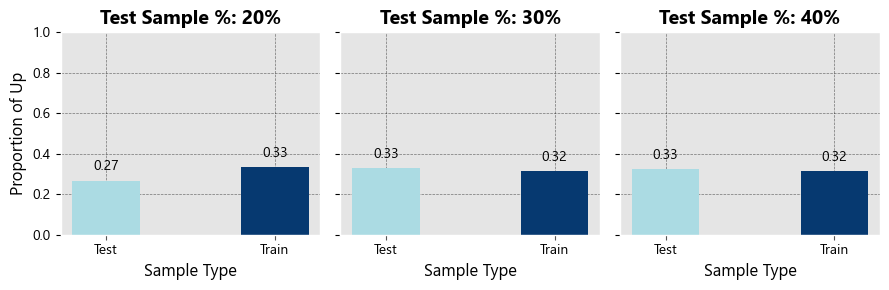

In [77]:

x = data.drop('Up', axis=1)

y = data['Up'].astype('float')

test_sample_pcts = [0.2, 0.3, 0.4]
proportions = pd.DataFrame(columns=['Test Sample %', 'Test Proportion of Up', 'Train Proportion of Up'])

for pct in test_sample_pcts:
    test_size = int(round(data.shape[0] * pct, 0))
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=test_size, shuffle=False)
    
    proportion_up_test = y_test.mean()
    proportion_up_train = y_train.mean()
    
    new_row = pd.DataFrame({'Test Sample %': [pct], 
                            'Test Proportion of Up': [proportion_up_test], 
                            'Train Proportion of Up': [proportion_up_train]})
    proportions = pd.concat([proportions, new_row], ignore_index=True)


plt.style.use('ggplot')
fig, axes = plt.subplots(1, 3, figsize=(9, 3), sharey=True)
colors = ['#abdbe3', '#063970']

for i, ax in enumerate(axes):
    pct = test_sample_pcts[i]
    proportion_up_test = proportions.loc[i, 'Test Proportion of Up']
    proportion_up_train = proportions.loc[i, 'Train Proportion of Up']
    
    ax.bar(['Test', 'Train'], 
           [proportion_up_test, proportion_up_train], 
           color=colors, width=0.4)
    
    ax.set_title(f'Test Sample %: {int(pct * 100)}%', fontsize=14, color='black', weight='bold')
    ax.set_xlabel('Sample Type', fontsize=12, color='black')
    if i == 0:
        ax.set_ylabel('Proportion of Up', fontsize=12, color='black')
    ax.set_ylim(0, 1)
    ax.tick_params(axis='y', colors='black')
    ax.grid(visible=True, color='black', linestyle='--', linewidth=0.5, alpha=0.5)
    ax.set_xticklabels(['Test', 'Train'], color='black')
    
    for j, proportion in enumerate([proportion_up_test, proportion_up_train]):
        ax.text(j, proportion + 0.05, f'{proportion:.2f}', ha='center', color='black')

plt.tight_layout()
plt.show(block=True)


As we can see above, the proportion of 'Up' observations in the 30% and 40% test sizes differ by 1% wheras a 20% sample size leads to a 6% difference. 

### **We opt for the 30% test sample size.**

###

## `30%` **test size split**

In [78]:
#redefine x and y - reset dtype on y
x = data.drop('Up', axis = 1)
y = data['Up'].astype('category')

test_sample_pct = 0.3  #test is 30% of the data set
test_size = int(round(data.shape[0] * test_sample_pct, 0))


x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = test_size, shuffle = False)

data_test = pd.concat([x_test, y_test])
data_train = pd.concat([x_train, y_train], axis = 1)

##

# Feature selection or extraction to reduce dimensionality
*Note: Only performed over training set*

**Features are scaled via:**
1. Normalisation - Normalisation scales the data to a fixed range, typically [0,1]
2. Standardisation - scales the data to have a mean of 0 and a standard deviation of 1

###

### We first split the training set into two subsets: a training set and a validation set
splitting the training data in this way allows us to perform out-of-sample (more accurately, out of training set) evaluation whilst avoiding data leakage.

In [79]:
train_observations = x_train.shape[0]

print(f' The training sample before creating the validation set contains {train_observations} observations')

 The training sample before creating the validation set contains 355 observations


###

### How large would the training and validation set be if we used the same (30%) split? 

In [80]:
train_exval_observations = round(x_train.shape[0]*0.7,0)
val_observations = round(x_train.shape[0]*0.3,0)

print(f' The training sample after creating the validation set would contain {train_exval_observations} weeks of observations.')
print(f' The validation would contain {val_observations} observations weeks of observations')

 The training sample after creating the validation set would contain 248.0 weeks of observations.
 The validation would contain 106.0 observations weeks of observations


###

### Given that we split the train & test data in a 70-30% ratio, and the sample sizes are relatively large, we will do the same here: 

In [81]:
x2 = data_train.drop('Up', axis = 1)
y2 = data_train['Up'].astype('category')

validation_sample_pct = 0.3  #test is 30% of the data set
validation_size = int(round(x_train.shape[0] * validation_sample_pct, 0))

# x_train excluding val data
x_train_exval, x_val, y_train_exval, y_val = train_test_split(x2, y2, test_size = validation_size, shuffle = False)

data_val = pd.concat([x_val, y_val])
data_train_exval = pd.concat([x_train_exval, y_train_exval], axis = 1)

**These variables are then scaled and tranformed:**

In [82]:

mms = MinMaxScaler()
x_train_exval_norm = mms.fit_transform(x_train_exval)
x_val_norm = mms.transform(x_val)


In [83]:

stdsc = StandardScaler()
x_train_exval_std = stdsc.fit_transform(x_train_exval)
x_val_std = stdsc.transform(x_val)


#

### We now fit a logistic regression model to the training and validation set and compare the in-sample performance with the out of sample (validation) performance:

In [84]:

lr = LogisticRegression(penalty='l1', C=1, solver='liblinear', multi_class='ovr')
lr.fit(x_train_exval_std, y_train_exval)


y_train_pred = lr.predict(x_train_exval_std)
y_val_pred = lr.predict(x_val_std)


train_precision = precision_score(y_train_exval, y_train_pred, average='binary')
val_precision = precision_score(y_val, y_val_pred, average='binary')

print('Training Precision:', round(train_precision,3))
print('Validation Precision:', round(val_precision,3))


Training Precision: 0.927
Validation Precision: 0.909


From the results above, we see that the precision rates differ marginally and do not suggest the model is overfitting.

In [85]:
lr.coef_[lr.coef_!=0].shape

(25,)

The fitted model contains 25 predictors which is a the overwhelming majority (out of 30)

###

###

### The impact of the value of the regularization strength hyperparameter C
 *C is the inverse of the regularization parameter 𝜆*

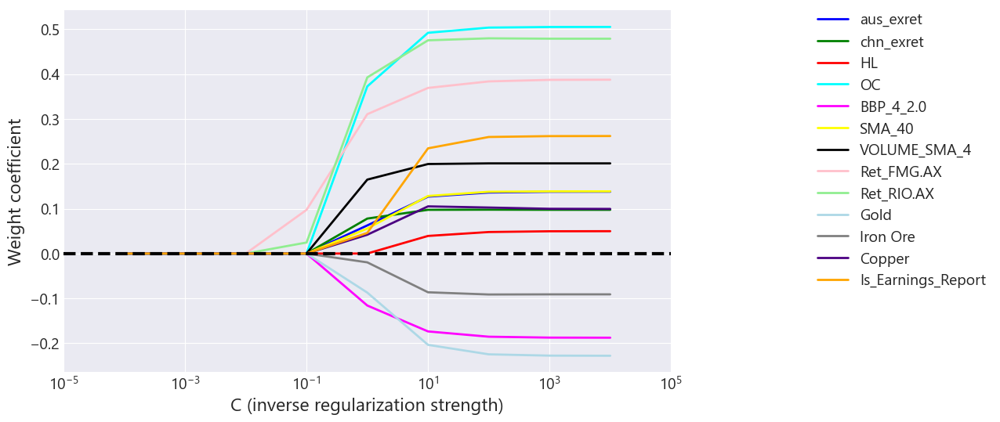

In [86]:
import matplotlib as mpl  
plt.style.use('seaborn-v0_8-darkgrid')
mpl.rcParams['font.family'] = 'segoe UI'
mpl.rcParams['figure.figsize'] = [10.0, 6.0]
mpl.rcParams['font.size'] = 14
mpl.rcParams['lines.linewidth'] = 2 
import matplotlib.pyplot as plt
#print(plt.style.available)


fig = plt.figure()
ax = plt.subplot(111)
    
colors = ['blue', 'green', 'red', 'cyan', 
          'magenta', 'yellow', 'black', 
          'pink', 'lightgreen', 'lightblue', 
          'gray', 'indigo', 'orange']

weights = []
params = []

for c in range(-4, 5):
    lr = LogisticRegression(penalty='l1', C=10.**c, solver='liblinear', 
                            multi_class='ovr', random_state=0)
    lr.fit(x_train_exval_std, y_train_exval)
    
    # in binary classification, lr.coef_ will only have one row
    if lr.coef_.shape[0] == 1:
        weights.append(lr.coef_[0])  
    else:
        weights.append(lr.coef_[1])  
    
    params.append(10**c)

weights = np.array(weights)

for column, color in zip(range(weights.shape[1]), colors):
    plt.plot(params, weights[:, column],
             label=x_train.columns[column],
             color=color)
plt.axhline(0, color='black', linestyle='--', linewidth=3)
plt.xlim([10**(-5), 10**5])
plt.ylabel('Weight coefficient')
plt.xlabel('C (inverse regularization strength)')
plt.xscale('log')
plt.legend(loc='upper left')
ax.legend(loc='upper center', 
          bbox_to_anchor=(1.38, 1.03),
          ncol=1, fancybox=True)


plt.show(block=True)

Note: all feature weights will be zero if we penalize the model with a strong regularisation parameter
(C < 0.01); C is the inverse of the regularization parameter, 𝜆:

The above graph gives an insight into L1 regularisation (hyperparamater tuning...). In this example, gold is the most heavily weighted coefficient (coef = 0.6 for C > 10^1) at all values of C > 10^-2, followed by bollinger band position which declnes to a lower relative weight than RIO Tinto returns around C < 10^-1.3

#

## Sequential feature selection algorithms
*Please note that these user defined functions were sourced from: Raschka, Liu & Mirjalli 2022* https://dl.ebooksworld.ir/books/Machine.Learning.with.PyTorch.and.Scikit-Learn.Sebastian.Raschka.Packt.9781801819312.EBooksWorld.ir.pdf

### We now consider an alternative way to reduce the complexity of the model and avoid overfitting during dimensionality reduction:
`Dimentionality reduction via feature selection`

*Defining functions:*

In [87]:
from itertools import combinations

class SBS:
    def __init__(self, estimator, k_features, scoring=precision_score,
                 test_size=0.3, random_state=1):
        self.scoring = scoring
        self.estimator = clone(estimator)
        self.k_features = k_features
        self.test_size = test_size
        self.random_state = random_state

    def fit(self, X, y):
        
        X_train, X_test, y_train, y_test = \
            train_test_split(X, y, test_size=self.test_size,
                             random_state=self.random_state)

        dim = X_train.shape[1]
        self.indices_ = tuple(range(dim))
        self.subsets_ = [self.indices_]
        score = self._calc_score(X_train, y_train, 
                                 X_test, y_test, self.indices_)
        self.scores_ = [score]

        while dim > self.k_features:
            scores = []
            subsets = []

            for p in combinations(self.indices_, r=dim - 1):
                score = self._calc_score(X_train, y_train, 
                                         X_test, y_test, p)
                scores.append(score)
                subsets.append(p)

            best = np.argmax(scores)
            self.indices_ = subsets[best]
            self.subsets_.append(self.indices_)
            dim -= 1

            self.scores_.append(scores[best])
        self.k_score_ = self.scores_[-1]

        return self

    def transform(self, X):
        return X[:, self.indices_]

    def _calc_score(self, X_train, y_train, X_test, y_test, indices):
        self.estimator.fit(X_train[:, indices], y_train)
        y_pred = self.estimator.predict(X_test[:, indices])
        score = self.scoring(y_test, y_pred)
        return score



###

## Sequential Backward Selection using KNN
`k_features` is a parameter for a Sequential Backward Selection (SBS) algorithm, which indicates the minimum number of features to select. Specifically, k_features=1 means that the SBS algorithm will reduce the feature set until only one feature remains.

Below we plot the relationship between precision and the number of features using the KNN model on the test set (excluding validation set). Note that the function internally separates the test (ex validation) into another test and validation subset.

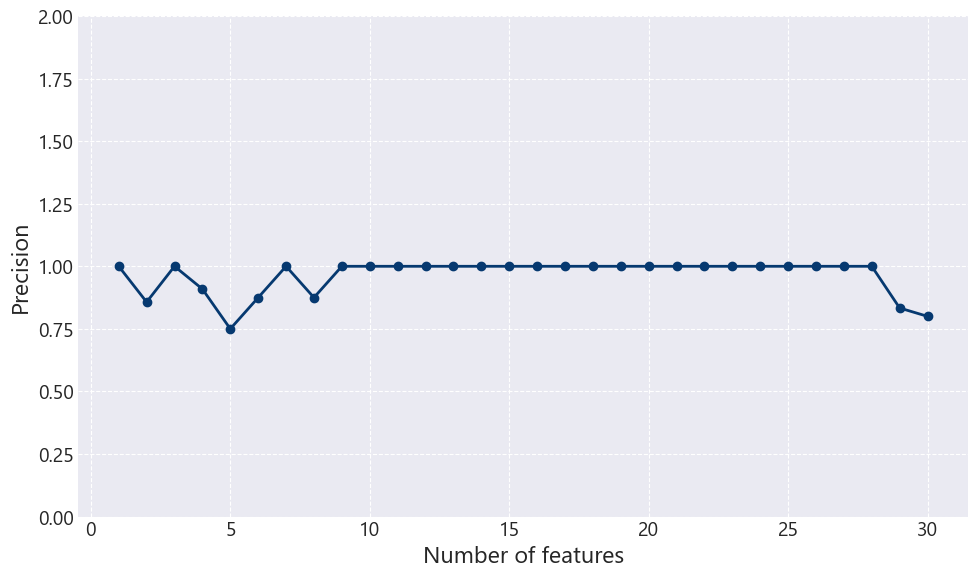

In [88]:
knn = KNeighborsClassifier(n_neighbors=5)

# selecting features
sbs = SBS(knn, k_features=1, scoring=precision_score, random_state=0)
sbs.fit(x_train_exval_std, y_train_exval)

# plotting performance of feature subsets
k_feat = [len(k) for k in sbs.subsets_]

plt.plot(k_feat, sbs.scores_, marker='o', color='#063970')
plt.ylim([0.0, 2.0])
plt.ylabel('Precision')
plt.xlabel('Number of features')
plt.grid(visible=True, which='both', linestyle='--')
plt.tight_layout()
plt.show()


*As we can see in the figure above, the precision of the KNN classifier decreased marginally on the validation dataset as
 the number of features decreased beyond 13, which is likely due to a decrease in dimensionality. Also, we can see in the following
plot that the classifier achieved 100 percent accuracy for k = 9 to 13*

In [89]:
k9 = list(sbs.subsets_[13])
not_selected = data_train.columns[0:][k9]

print("Not Selected in KNN subset 13")
print("-----------------------------")
for i in not_selected:
    print(i)

Not Selected in KNN subset 13
-----------------------------
aus_exret
chn_exret
HL
OC
BBP_4_2.0
SMA_40
VOLUME_SMA_4
Ret_FMG.AX
Ret_RIO.AX
Iron Ore
Copper
Is_Earnings_Report
Earnings_Report_length
broker_upgrades
AUDUSD=X
Dividends
reversal_down


#

In [90]:
knn.fit(x_train_exval_std, y_train_exval)
print('Training precision:', round(knn.score(x_train_exval_std, y_train_exval),3))
print('Validation precision:', round(knn.score(x_val_std, y_val),3))

Training precision: 0.759
Validation precision: 0.783


***
In the preceding code section, we used the complete feature set and obtained 75.5 percent
precision on the training dataset and approximately 77.4 percent precision on the validation dataset, which
indicates that our model already generalizes well to new data. We compare this with the selected nine-feature
subset and see how well KNN performs:

###

In [91]:
knn.fit(x_train_exval_std[:, k9], y_train_exval)
print('Training precision:', round(knn.score(x_train_exval_std[:, k9], y_train_exval),3))
print('Validation precision:', round(knn.score(x_val_std[:, k9], y_val),3))

Training precision: 0.807
Validation precision: 0.764


###

***
There is a slight decrease in the validation precision rate from 77.4% where KNN was applied to all predictors, to 75.5% with the selected 9 feature subset.

###

# Assessing feature importance with Random Forest
Using a random forest, we can measure the feature importance as the averaged impurity decrease computed from all decision trees in the forest, without making any assumptions about whether our data is linearly separable or not. As a result we fit this model on the `entire training set`

 1) reversal_down                  0.134547
 2) CADUSD=X                       0.064286
 3) Ret_RIO.AX                     0.063902
 4) GBPUSD=X                       0.055189
 5) Ret_FMG.AX                     0.054256
 6) Iron Ore                       0.052572
 7) OC                             0.049527
 8) SMA_40                         0.048715
 9) BBP_4_2.0                      0.046663
10) EURUSD=X                       0.046158
11) CLPUSD=X                       0.045984
12) Gold                           0.045914
13) VOLUME_SMA_4                   0.044721
14) HL                             0.043910
15) Copper                         0.042627
16) AUDUSD=X                       0.041593
17) aus_exret                      0.039204
18) chn_exret                      0.032160
19) reversal_up                    0.016171
20) broker_upgrades                0.006040
21) Dividends                      0.004792
22) 2_week(s)_until_div            0.003488
23) broker_downgrades           

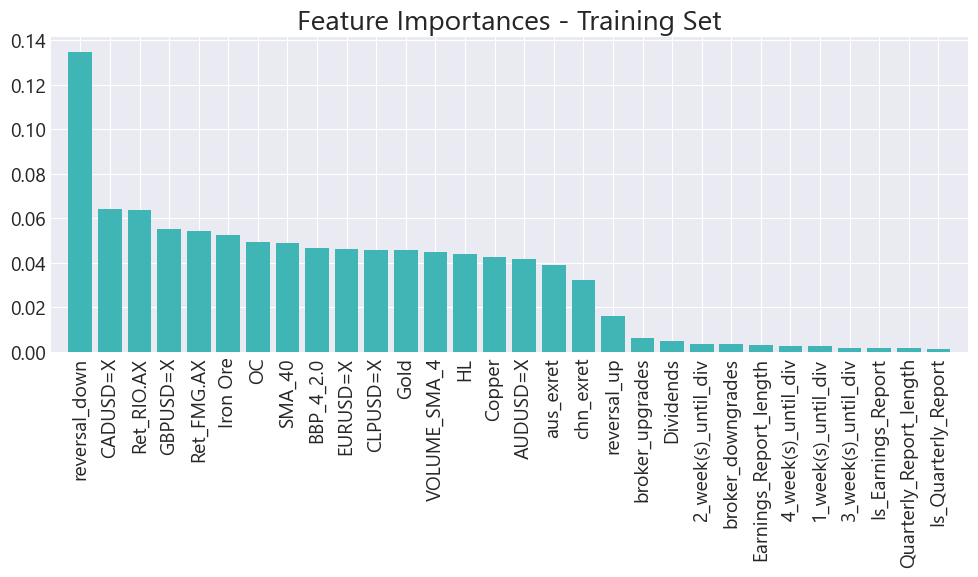

In [92]:
from sklearn.ensemble import RandomForestClassifier
import matplotlib.pyplot as plt

feat_labels = x_train.columns

forest = RandomForestClassifier(n_estimators=10000, random_state=0)
forest.fit(x_train, y_train)
importances = forest.feature_importances_

indices = np.argsort(importances)[::-1]

for f in range(x_train.shape[1]):
    print("%2d) %-*s %f" % (f + 1, 30, feat_labels[indices[f]], importances[indices[f]]))

plt.title('Feature Importances - Training Set')
plt.bar(range(x_train.shape[1]), 
        importances[indices],
        align='center', 
        color='#40B5B5')

plt.xticks(range(x_train.shape[1]), feat_labels[indices], rotation=90)
plt.xlim([-1, x_train.shape[1]])
plt.tight_layout()
plt.show()


*AThe plot above ranks the different features by their
relative importance; note that the feature importance values are normalized so that they sum up to 1.0*

###

In [93]:
# Note threshold is set equal to the weight expeced if each feature was equally 'important'
threshold = 1/x_train.shape[1]
threshold

0.03333333333333333

In [94]:
from sklearn.feature_selection import SelectFromModel

sfm = SelectFromModel(forest, threshold=threshold, prefit=True)
x_selected = sfm.transform(x_train)
print('Number of features that meet this threshold criterion:', x_selected.shape[1])

Number of features that meet this threshold criterion: 17


In [95]:
for f in range(x_selected.shape[1]):
    print("%2d) %-*s %f" % (f + 1, 30, 
                            feat_labels[indices[f]], 
                            importances[indices[f]]))

 1) reversal_down                  0.134547
 2) CADUSD=X                       0.064286
 3) Ret_RIO.AX                     0.063902
 4) GBPUSD=X                       0.055189
 5) Ret_FMG.AX                     0.054256
 6) Iron Ore                       0.052572
 7) OC                             0.049527
 8) SMA_40                         0.048715
 9) BBP_4_2.0                      0.046663
10) EURUSD=X                       0.046158
11) CLPUSD=X                       0.045984
12) Gold                           0.045914
13) VOLUME_SMA_4                   0.044721
14) HL                             0.043910
15) Copper                         0.042627
16) AUDUSD=X                       0.041593
17) aus_exret                      0.039204


Downwards reversal, CAD:USD and Rio tinto returns are the most discriminative features in the dataset based on the average impurity decrease in the 500 decision trees in our model.  Interestingly, two of the top-ranked features in the plot are also in the three-feature subset selection from the SBS algorithm that we implemented in the previous section

Note: If two or more features are highly correlated, one feature may
be ranked very highly while the information on the other feature(s) may not be fully captured. . On
the other hand, we don’t need to be concerned about this problem if we are merely interested in the
predictive performance of a model rather than the interpretation of feature importance values.

#

In [96]:
for i in data_train.columns:
    if data_train[i].dtype not in ['object', 'category']:
        print(f'{i} skew: {round(data_train[i].skew(),2)}')


aus_exret skew: -0.1
chn_exret skew: -0.05
HL skew: 2.3
OC skew: 0.16
BBP_4_2.0 skew: -0.11
SMA_40 skew: -0.95
VOLUME_SMA_4 skew: 1.34
Ret_FMG.AX skew: 0.18
Ret_RIO.AX skew: -0.04
Gold skew: -0.0
Iron Ore skew: -1.28
Copper skew: 0.06
Earnings_Report_length skew: 8.19
Quarterly_Report_length skew: 4.91
AUDUSD=X skew: -0.54
CADUSD=X skew: -0.35
CLPUSD=X skew: 0.03
EURUSD=X skew: -0.18
GBPUSD=X skew: -0.8
Dividends skew: 7.6


As you can see, `Dividends`, `Earnings_report_length` and `quarterly_report_length` are significantly skewed which we address by dropping the vars as they performed poorly in previous tests:

In [97]:
data_train = data_train.drop(['Dividends', 'Earnings_Report_length', 'Quarterly_Report_length'], axis=1)
data_train.head(3)

,aus_exret,chn_exret,HL,OC,BBP_4_2.0,SMA_40,VOLUME_SMA_4,Ret_FMG.AX,Ret_RIO.AX,Gold,...,CLPUSD=X,EURUSD=X,GBPUSD=X,1_week(s)_until_div,2_week(s)_until_div,3_week(s)_until_div,4_week(s)_until_div,reversal_down,reversal_up,Up
Date,,,,,,,,,,,,,,,,,,,,,
2015-01-25,0.0,0.000000,0.066423,0.014451,0.237265,0.0,33762235.0,-0.008584,-0.008135,0.011847,...,-0.018229,-0.016689,0.000915,0.0,0.0,0.0,0.0,1.0,0.0,1.0
2015-02-01,0.0,-0.006915,0.059990,-0.036944,0.888443,0.0,41578867.5,-0.128618,0.033732,-0.000387,...,0.003139,-0.024934,-0.004861,0.0,0.0,0.0,0.0,1.0,0.0,1.0
2015-02-08,0.0,0.007693,0.069016,-0.053958,0.889505,0.0,49819686.0,0.234840,0.063738,-0.005017,...,-0.004633,0.000397,0.000678,0.0,0.0,0.0,0.0,0.0,0.0,1.0


#

***
# **Data Exploration** 
*Skip directly to section 5 if desired, there are no dependencies in section 4*

###

**Note: to reduce the size of this file, we run the pandas profile report in two seperate files**
1. Regular profile report
2. Time Series profile report

In [98]:
# function to save df
def df_to_csv(df, file_name):
    try:
        df.to_csv(file_name, index=True, index_label='Date')
        print(f"Saved to {file_name}")
        
    except Exception as e:
        print(f"ERROR: {e}")
        

In [99]:
# Save Checkpoint - this is used in the profile report
df_to_csv(data_train, file_name = "CaiWilliams_Training_Data_BFF5555_Final")

Saved to CaiWilliams_Training_Data_BFF5555_Final


In [100]:
data_train = pd.read_csv("CaiWilliams_Training_Data_BFF5555_Final", index_col = "Date", na_values ='?')
data_train.dropna(inplace = True)
print("Training Data Scuccesfully Loaded...")

Training Data Scuccesfully Loaded...


In [101]:

categorical_features = ['Up', 'Is_Earnings_Report', 'Is_Quarterly_Report', 'broker_upgrades', 'broker_downgrades', '1_week(s)_until_div', '2_week(s)_until_div', '3_week(s)_until_div', '4_week(s)_until_div', 'reversal_down', 'reversal_up']


for feature in categorical_features:

    if feature in data_train.columns: 
        data_train[feature] = data_train[feature].astype('category')

###

### *Basic Information*

In [102]:
data_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 355 entries, 2015-01-25 to 2021-11-07
Data columns (total 28 columns):
 #   Column               Non-Null Count  Dtype   
---  ------               --------------  -----   
 0   aus_exret            355 non-null    float64 
 1   chn_exret            355 non-null    float64 
 2   HL                   355 non-null    float64 
 3   OC                   355 non-null    float64 
 4   BBP_4_2.0            355 non-null    float64 
 5   SMA_40               355 non-null    float64 
 6   VOLUME_SMA_4         355 non-null    float64 
 7   Ret_FMG.AX           355 non-null    float64 
 8   Ret_RIO.AX           355 non-null    float64 
 9   Gold                 355 non-null    float64 
 10  Iron Ore             355 non-null    float64 
 11  Copper               355 non-null    float64 
 12  Is_Earnings_Report   355 non-null    category
 13  Is_Quarterly_Report  355 non-null    category
 14  broker_upgrades      355 non-null    category
 15  broker_downg

### *Summary statistics* 

In [103]:
# include = 'all' includes categorical dtype specific stats
data_train.describe(include = 'all')

,aus_exret,chn_exret,HL,OC,BBP_4_2.0,SMA_40,VOLUME_SMA_4,Ret_FMG.AX,Ret_RIO.AX,Gold,...,CLPUSD=X,EURUSD=X,GBPUSD=X,1_week(s)_until_div,2_week(s)_until_div,3_week(s)_until_div,4_week(s)_until_div,reversal_down,reversal_up,Up
count,355.000000,355.000000,355.000000,355.000000,355.000000,355.000000,3.550000e+02,355.000000,355.000000,355.000000,...,355.000000,355.000000,355.000000,355.0,355.0,355.0,355.0,355.0,355.0,355.0
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,2.0,2.0,2.0,2.0,2.0,2.0,2.0
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,340.0,340.0,340.0,340.0,319.0,318.0,243.0
mean,0.000011,0.000322,0.053566,-0.001065,0.522601,24.781325,4.371584e+07,0.006860,0.002290,0.000267,...,-0.000773,-0.000053,-0.000283,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,0.004118,0.003125,0.028841,0.038316,0.277985,10.616392,1.310290e+07,0.063517,0.036210,0.004147,...,0.248687,0.009094,0.011222,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,-0.019272,-0.018025,0.014870,-0.148934,0.069184,0.000000,1.969007e+07,-0.192734,-0.115859,-0.016869,...,-3.302091,-0.034656,-0.067291,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,0.000000,0.000000,0.035013,-0.026160,0.265764,20.063891,3.483926e+07,-0.032779,-0.018919,-0.002160,...,-0.010387,-0.005146,-0.006959,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,0.000000,0.000000,0.046145,-0.002774,0.520903,26.168637,4.123243e+07,0.003356,0.003310,0.000452,...,0.000256,0.000165,-0.000245,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,0.000479,0.000527,0.064969,0.022839,0.791463,32.025405,4.874684e+07,0.043688,0.024219,0.002411,...,0.008979,0.005131,0.006849,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### *Checking for missing values* 

In [104]:
missing_values = data_train.isnull().sum().sort_values(ascending=False)
mv = missing_values[missing_values > 0].sum()
print(f'{mv} missing values')

0 missing values


*Note that this was handled well in the feature construction process*

###

### *Data types* 

In [105]:
data_train.dtypes


aus_exret               float64
chn_exret               float64
HL                      float64
OC                      float64
BBP_4_2.0               float64
SMA_40                  float64
VOLUME_SMA_4            float64
Ret_FMG.AX              float64
Ret_RIO.AX              float64
Gold                    float64
Iron Ore                float64
Copper                  float64
Is_Earnings_Report     category
Is_Quarterly_Report    category
broker_upgrades        category
broker_downgrades      category
AUDUSD=X                float64
CADUSD=X                float64
CLPUSD=X                float64
EURUSD=X                float64
GBPUSD=X                float64
1_week(s)_until_div    category
2_week(s)_until_div    category
3_week(s)_until_div    category
4_week(s)_until_div    category
reversal_down          category
reversal_up            category
Up                     category
dtype: object

###

### *Distrubution of numerical variables* 

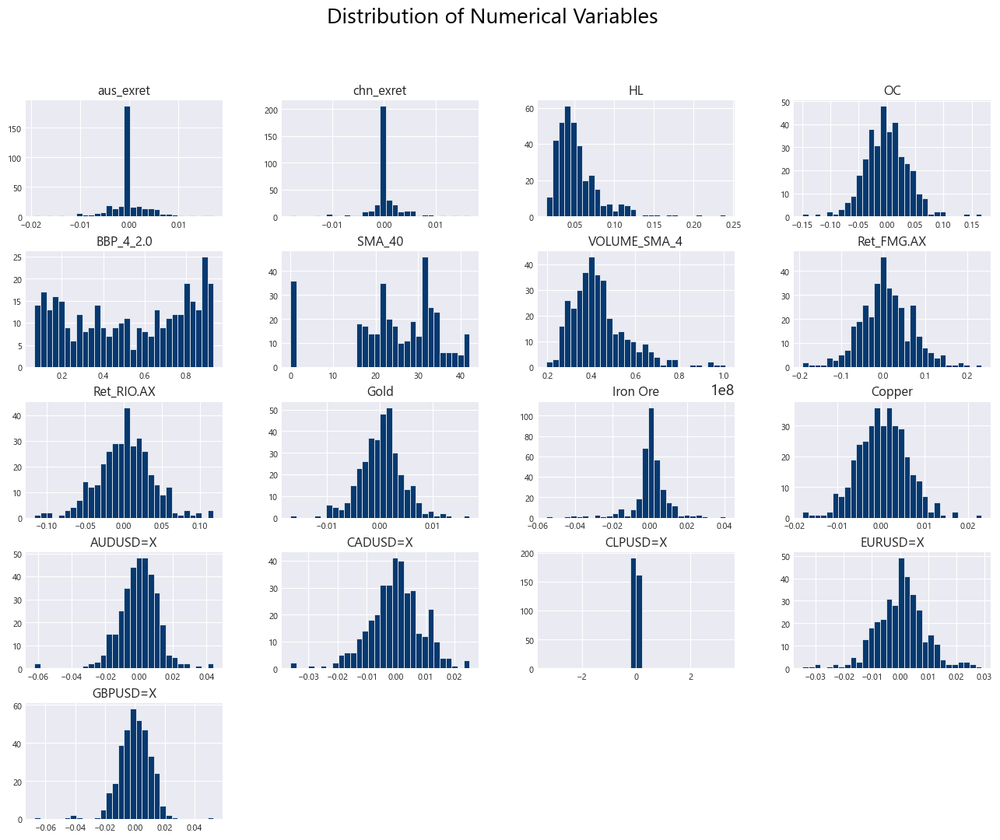

In [106]:
num_columns = data_train.select_dtypes(include=[np.number]).columns
axes = data_train[num_columns].hist(figsize=(16, 12), bins=30, edgecolor='white', color='#063970')

for ax in axes.flatten():
    ax.title.set_fontsize(12)   # Title font size
    ax.xaxis.label.set_fontsize(10)  # X-axis label font size
    ax.yaxis.label.set_fontsize(10)  # Y-axis label font size
    ax.tick_params(axis='both', labelsize=8)  # Tick label font size for both axes

plt.suptitle('Distribution of Numerical Variables', fontsize=20, color='black')
plt.show(block=True)



There are several variables with distributions that are unlikely to contain any predictive value (ie. possible class feature). 

**These include:**
- Earnings report length
- quarterly report length
- CLPUSD=X
- Dividends

***

A large number of non-normal distributions are observed in the feature set. From a visual inspection, I categorize the distributions of the non-noral features below:
- there is a need for scaling

###

### **Distibution of categorical variables** 

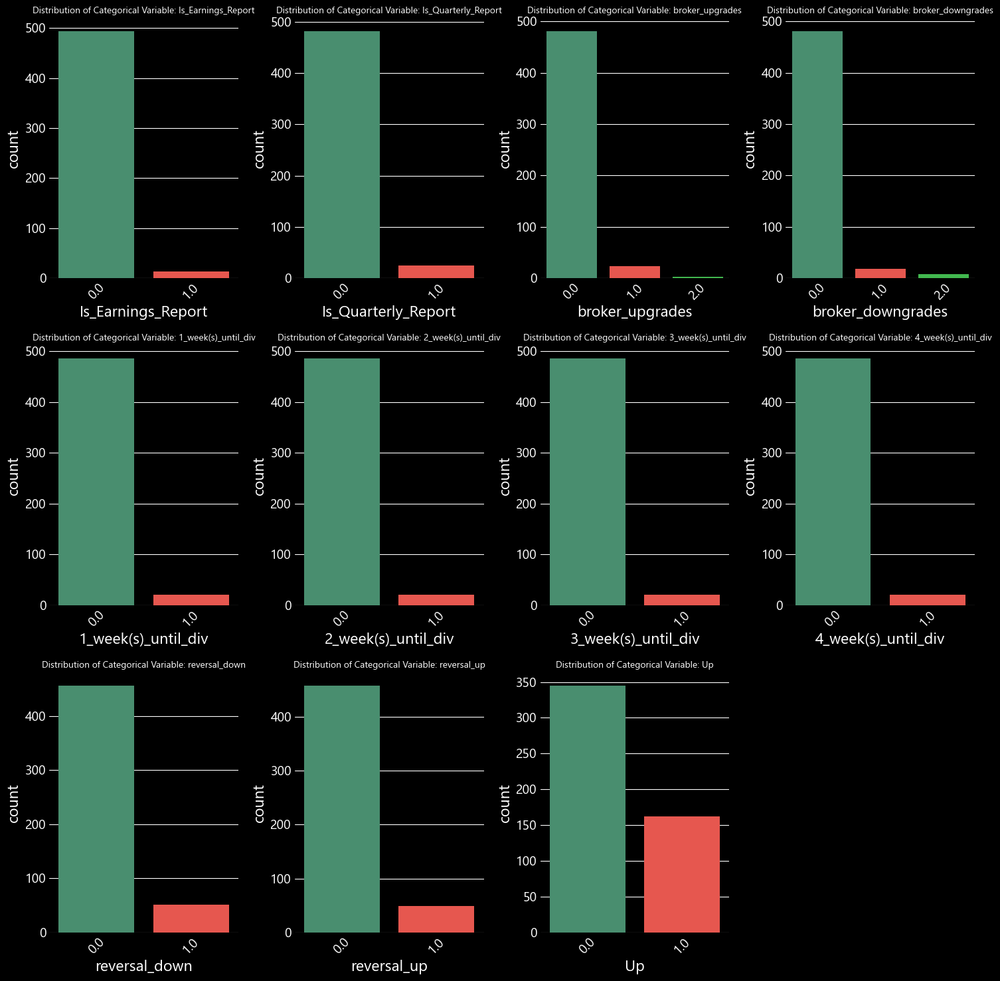

In [107]:

palette = ["#3D9970", "#FF4136", "#2ECC40", "#0074D9", "#FF851B", "#B10DC9", "#85144b", "#FFDC00"]
plt.style.use('dark_background')

# Select categorical columns
cat_columns = data_train.select_dtypes(exclude=[np.number]).columns
num_cols = len(cat_columns)

# Define subplot layout
ncols = 4
nrows = (num_cols // ncols) + (num_cols % ncols > 0)
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, 5 * nrows))
axes = axes.flatten()

# Iterate over categorical columns and plot each one
for i, col in enumerate(cat_columns):
    sns.countplot(x=col, data=data, palette=palette, ax=axes[i])
    axes[i].set_title(f'Distribution of Categorical Variable: {col}', fontsize=10, color='white')
    axes[i].tick_params(axis='x', rotation=45, colors='white')
    axes[i].tick_params(axis='y', colors='white')
    axes[i].spines['top'].set_visible(False)
    axes[i].spines['right'].set_visible(False)

# Hide any unused subplots
for j in range(i + 1, nrows * ncols):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show(block=True)

### *4.6 Correlation matrix for numerical variables* 

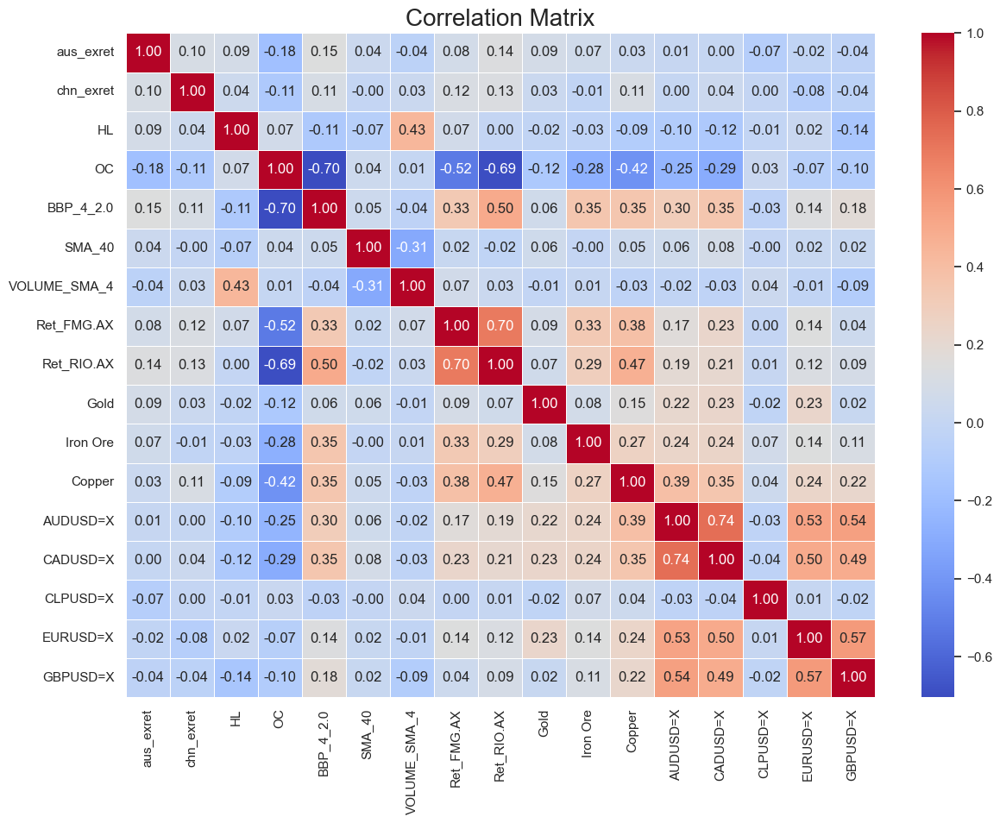

In [108]:
sns.set_theme(style="whitegrid")
plt.figure(figsize=(14, 10))
corr_matrix = data_train[num_columns].corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix', fontsize=20)
plt.show()

To steamline the identification of problematic correlations, we write the following code and define a min/max `correlation threshold` to identify highly correlated features:

In [109]:
# Set problematic correlation threshold
threshold = 0.7

max_corr = {}
min_corr = {}

for col in corr_matrix.columns:
    col_corrs = corr_matrix[col].drop(col)
    
    # Find maximum correlation
    max_corr_val = col_corrs.max()
    max_corr_var = col_corrs.idxmax()
    max_corr[col] = (max_corr_var, max_corr_val)
    
    # Find minimum correlation
    min_corr_val = col_corrs.min()
    min_corr_var = col_corrs.idxmin()
    min_corr[col] = (min_corr_var, min_corr_val)

### **Extreme Positive Correlations**

In [110]:
print("High Positive Correlations:")
for var, (max_var, max_val) in max_corr.items():
    if max_val > threshold:
        print(f"{var} is most positively correlated with {max_var}: {max_val:.3f}")

High Positive Correlations:
AUDUSD=X is most positively correlated with CADUSD=X: 0.736
CADUSD=X is most positively correlated with AUDUSD=X: 0.736


As expected, the FX returns AUD USD and AUD CAD are highly correlated with one another. This is in addition to the AUD:USD and CAD:USD pairs which are both expressed relative to the US dollar.  

###

### **Extreme Negative Correlation**

In [111]:
print("Highly Negative Correlations:")
for var, (min_var, min_val) in min_corr.items():
    if min_val < -threshold:
        print(f"{var} is most negatively correlated with {min_var}: {min_val:.3f}")

Highly Negative Correlations:
OC is most negatively correlated with BBP_4_2.0: -0.704
BBP_4_2.0 is most negatively correlated with OC: -0.704


One high negative correlation - not problematic

### **Pair plot for numerical variables** 

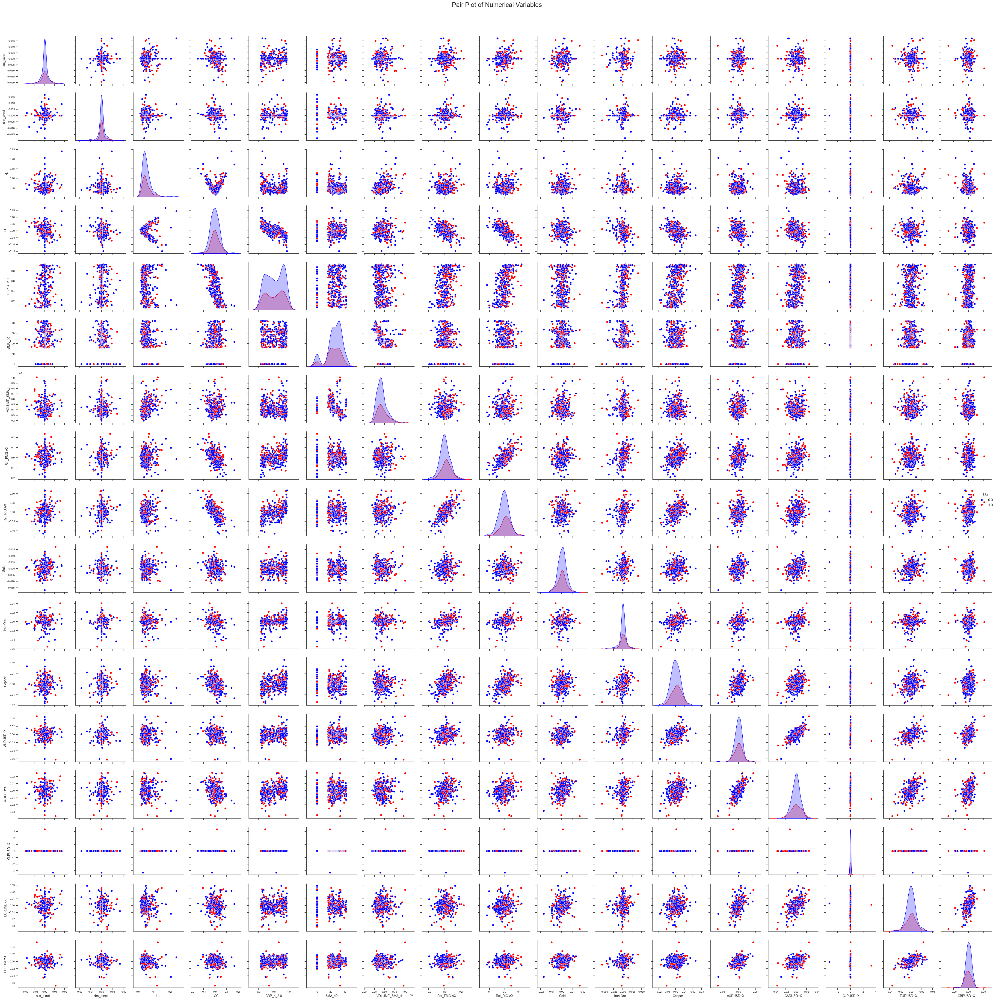

In [112]:
import seaborn as sns
import matplotlib.pyplot as plt

# Configure seaborn to allow for better label visibility
sns.set(style="ticks", rc={"axes.labelsize": 10, "xtick.labelsize": 8, "ytick.labelsize": 8})

# Create a temporary DataFrame that includes numerical columns and 'Up'
plot_data = x_train[num_columns].copy()
plot_data['Up'] = y_train

# Generate the pair plot with hue based on 'Up'
pair_plot = sns.pairplot(data=plot_data, hue='Up', palette={0: 'blue', 1: 'red'})

# Improve layout to ensure labels are visible
plt.suptitle('Pair Plot of Numerical Variables', y=1.02, fontsize=20)
plt.tight_layout()

# Show the plot
plt.show()


### **Boxplots for outlier detection**

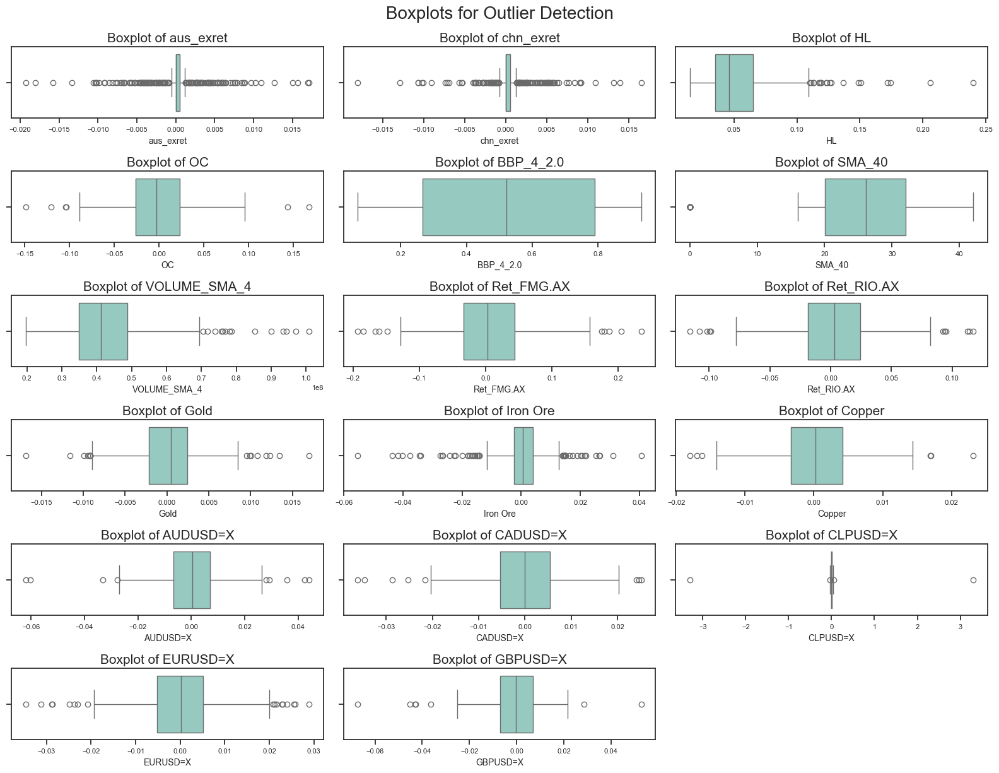

In [113]:
plt.figure(figsize=(16, 12))
for i, col in enumerate(num_columns):
    plt.subplot(len(num_columns)//3 + 1, 3, i+1)
    sns.boxplot(x=data_train[col], palette='Set3')
    plt.title(f'Boxplot of {col}', fontsize=15)
    plt.tight_layout()

plt.suptitle('Boxplots for Outlier Detection', y=1.02, fontsize=20)
plt.show()

### *Relationship between categorical and numerical variables* 

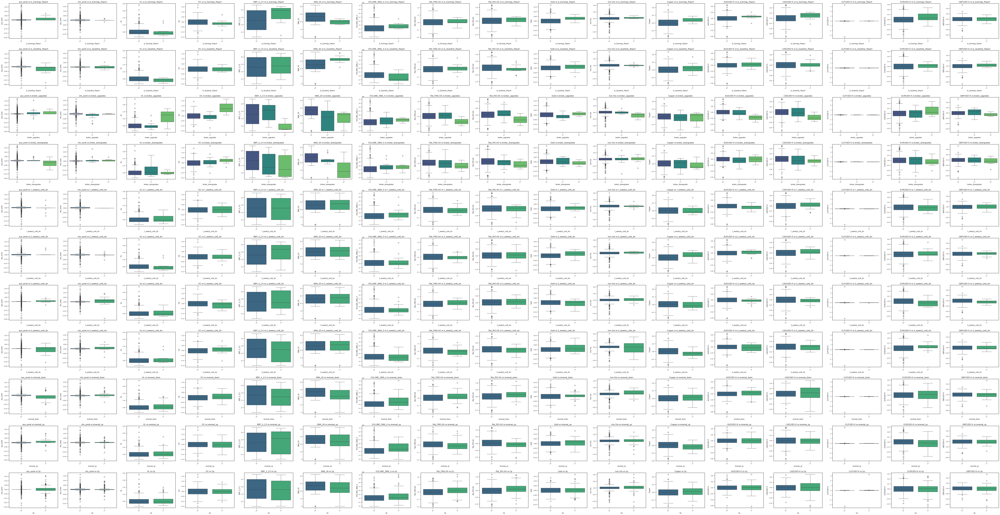

In [114]:
num_rows = len(cat_columns)
num_cols = len(num_columns)

# subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(num_cols * 5, num_rows * 4))

if num_rows == 1:
    axes = np.expand_dims(axes, axis=0)
if num_cols == 1:
    axes = np.expand_dims(axes, axis=1)

for i, col in enumerate(cat_columns):
    for j, num_col in enumerate(num_columns):
        sns.boxplot(x=col, y=num_col, data=data_train, palette='viridis', ax=axes[i, j])
        axes[i, j].set_title(f'{num_col} vs {col}', fontsize=12)
        axes[i, j].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

### *4.10 Skewness of numerical variables* 

In [115]:
skew = data_train[num_columns].skew()
skew.sort_values()

Iron Ore       -1.279489
SMA_40         -0.951861
GBPUSD=X       -0.800628
AUDUSD=X       -0.543528
CADUSD=X       -0.349455
EURUSD=X       -0.180642
BBP_4_2.0      -0.106963
aus_exret      -0.097994
chn_exret      -0.050686
Ret_RIO.AX     -0.044091
Gold           -0.001216
CLPUSD=X        0.031431
Copper          0.064153
OC              0.156097
Ret_FMG.AX      0.175337
VOLUME_SMA_4    1.336861
HL              2.297906
dtype: float64

### *4.11 Pairwise relationships and ineraction effects* 

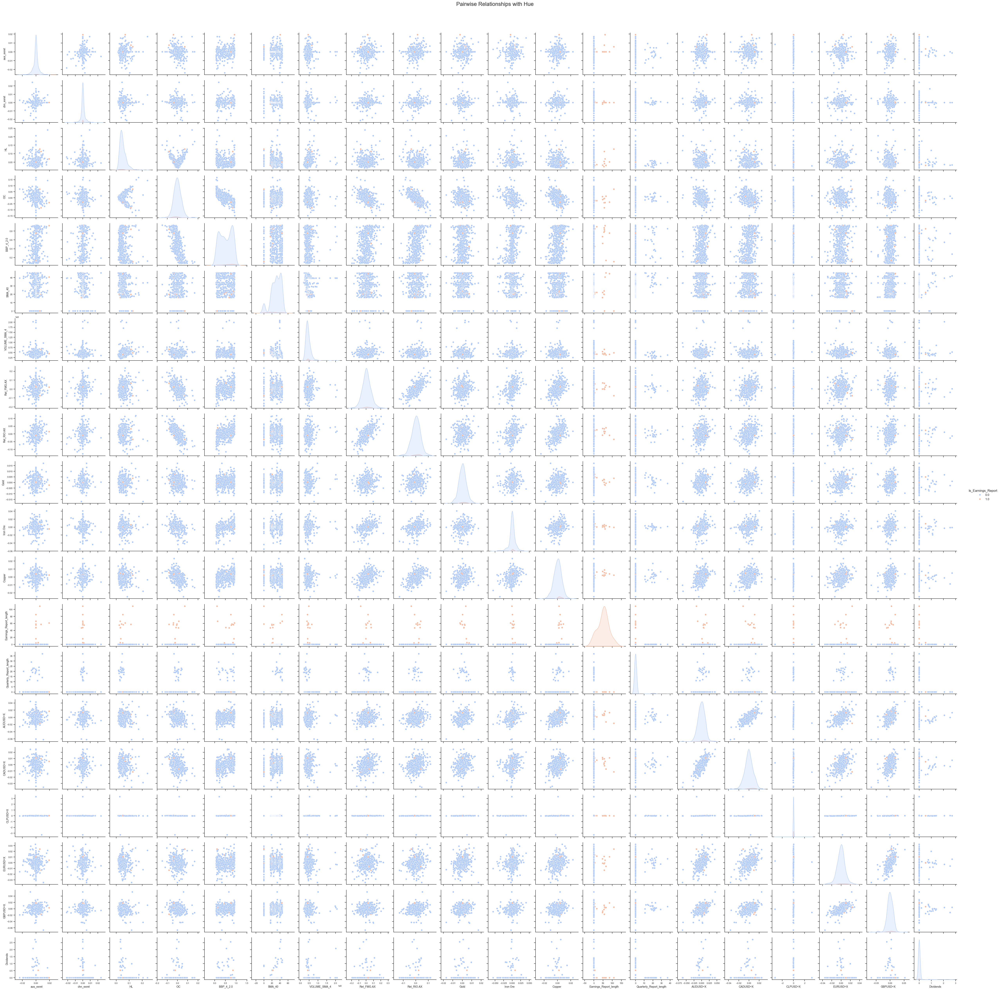

In [116]:
sns.pairplot(data, hue=cat_columns[0], palette='coolwarm')
plt.suptitle('Pairwise Relationships with Hue', y=1.02, fontsize=20)
plt.show()

###

#

***
# **Dealing with problematic features** 

In [117]:
def outlier_columns(df, threshold=5):
    """
    This function returns columns in dataframe df that have the proportion of outliers exceeding the given threshold. 5 here means 5%
    This function identifies outliers using the interquartile method which defines outliers as those that lie outside 1.5 times the interquartile
    range (IQR = Q3 - Q1)
    """
    # Select only numeric columns
    numeric_df = df.select_dtypes(include=[np.number])
    
    Q1 = numeric_df.quantile(0.25)
    Q3 = numeric_df.quantile(0.75)
    IQR = Q3 - Q1

    outliers = ((numeric_df < (Q1 - 1.5 * IQR)) | (numeric_df > (Q3 + 1.5 * IQR)))
    proportion_outliers = (outliers.sum() / len(df)) * 100
    outlier_features = proportion_outliers[proportion_outliers > threshold].index.tolist()
    
    return proportion_outliers, outlier_features


###

## * Dropping problematic data based on poor performance in prelimanary feature selection*

In [118]:
cols_to_drop = ['OC']

x_train = x_train.drop(columns=cols_to_drop)
x_test = x_test.drop(columns=cols_to_drop)


In [119]:
proportion_outliers, outlier_features = outlier_columns(x_train)
nonoutlier_features = [col for col in x_train.columns if col not in outlier_features]
proportion_outliers.sort_values(ascending = False)

aus_exret                  44.507042
chn_exret                  34.366197
Iron Ore                   13.239437
SMA_40                     10.140845
HL                          5.352113
EURUSD=X                    4.788732
Gold                        4.507042
Dividends                   4.225352
VOLUME_SMA_4                3.943662
Quarterly_Report_length     3.943662
Ret_RIO.AX                  3.098592
Ret_FMG.AX                  2.816901
Earnings_Report_length      2.816901
AUDUSD=X                    2.535211
CADUSD=X                    2.253521
GBPUSD=X                    1.971831
Copper                      1.690141
CLPUSD=X                    1.126761
BBP_4_2.0                   0.000000
dtype: float64

In [120]:
outlier_features

['aus_exret', 'chn_exret', 'HL', 'SMA_40', 'Iron Ore']

###

#

***
# **Step 4. Algorithm selection**  

**Recall that our objective is to accurately predict positive weekly returns in BHP's stock price.**


This is an example of a binary `classification` problem in machine learning.


The following algorithms may be used in binary classification problems:

*Index:*
* 1 - Logistic regression
* 2 - Linear Discriminant Analysis
* 3 - Quadratic Discriminant Analysis
* 4 - Gaussian Naive Bayes
* 5 - K Nearest Neighbours
* 6 - Support Vector Machines
* 7 - Random Forrest
* **8 - Code to run all models at once** 

###

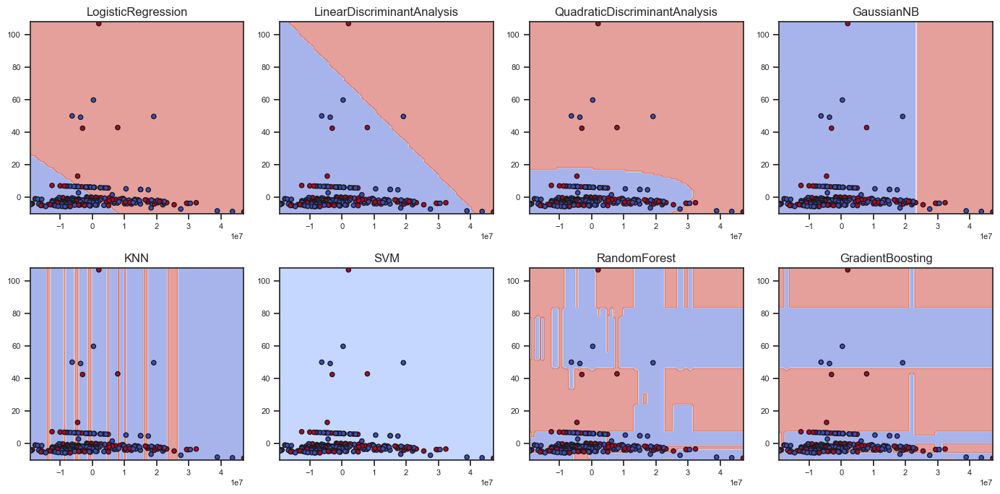

In [125]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.inspection import DecisionBoundaryDisplay
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier  # Importing the new classifier


pca = PCA(n_components=2)
x_train_2d = pca.fit_transform(x_train_exval)
x_val_2d = pca.transform(x_val)


classifiers = {
    'LogisticRegression': LogisticRegression(),
    'LinearDiscriminantAnalysis': LinearDiscriminantAnalysis(),
    'QuadraticDiscriminantAnalysis': QuadraticDiscriminantAnalysis(),
    'GaussianNB': GaussianNB(),
    'KNN': KNeighborsClassifier(),
    'SVM': SVC(),
    'RandomForest': RandomForestClassifier(),
    'GradientBoosting': GradientBoostingClassifier()  # for illistrative purposes
}

# Plotting function for decision boundaries
def plot_decision_boundary(X, y, classifier, ax, title):
    """Plots the decision boundary of a classifier in 2D space."""
    # Fit the classifier with the 2D data
    classifier.fit(X, y)

    # Plot the decision boundary
    DecisionBoundaryDisplay.from_estimator(
        classifier, X, cmap=plt.cm.coolwarm, alpha=0.5, ax=ax, response_method='predict'
    )
    
    # Scatter plot of the data points
    ax.scatter(X[:, 0], X[:, 1], c=y, cmap=plt.cm.coolwarm, s=20, edgecolor='k')
    ax.set_title(title)
    ax.set_xlabel('')
    ax.set_ylabel('')

# Prepare the figure for subplots
fig, axes = plt.subplots(2, 4, figsize=(14, 7))
axes = axes.ravel()  # Flatten the 2D array of axes for easy iteration

# Iterate over classifiers and plot the decision boundary for each
for i, (name, classifier) in enumerate(classifiers.items()):
    ax = axes[i]
    plot_decision_boundary(x_train_2d, y_train_exval, classifier, ax, title=name)

# Adjust layout and show the plot
plt.tight_layout()
plt.show(block=True)

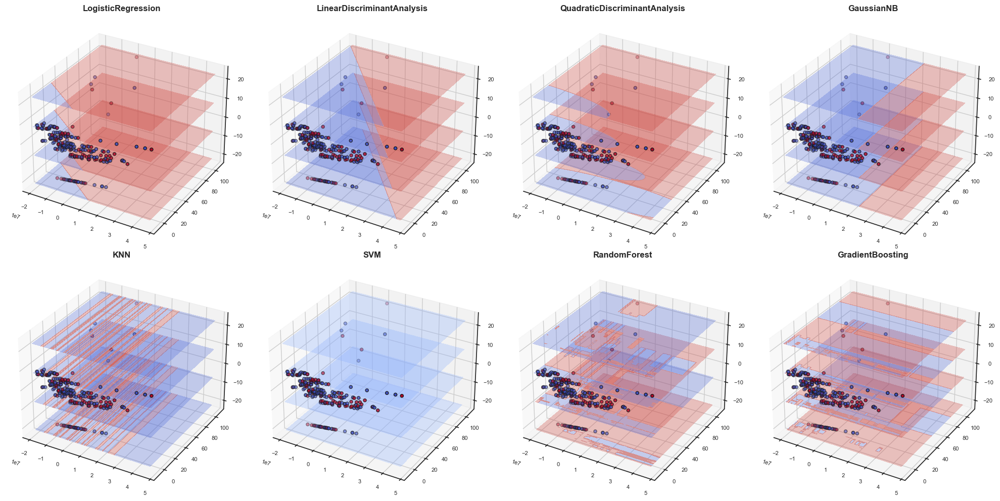

In [126]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.decomposition import PCA

# PCA with 3 components for 3D plotting
pca = PCA(n_components=3)
x_train_3d = pca.fit_transform(x_train_exval)
x_val_3d = pca.transform(x_val)

# Function to plot decision boundaries across multiple 2D slices in 3D space
def plot_decision_boundary_3d(X, y, classifier, ax, title):
    """Plots decision boundaries on slices in 3D space."""
    classifier.fit(X, y)
    # Define slice positions
    z_slices = np.linspace(X[:, 2].min(), X[:, 2].max(), num=4)
    
    for z_slice in z_slices:
        # Select a slice and create a meshgrid in the 2D plane for that slice
        x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
        y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
        xx, yy = np.meshgrid(np.linspace(x_min, x_max, 1000), np.linspace(y_min, y_max, 1000))
        
        # Predict using classifier on the 2D grid, with z held constant
        grid = np.c_[xx.ravel(), yy.ravel(), np.full(xx.ravel().shape, z_slice)]
        Z = classifier.predict(grid).reshape(xx.shape)
        
        # Plot the decision boundary in 3D as a filled contour on the slice
        ax.contourf(xx, yy, Z, zdir='z', offset=z_slice, cmap=plt.cm.coolwarm, alpha=0.3)
    
    # Scatter plot of the data points
    ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=y, cmap=plt.cm.coolwarm, s=20, edgecolor='k')
    ax.set_title(title, fontweight='bold')  # Set title with bold font
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_zlabel('')

# Prepare the figure for 3D subplots
fig = plt.figure(figsize=(20, 10))
axes = [fig.add_subplot(2, 4, i+1, projection='3d') for i in range(len(classifiers))]

# Iterate over classifiers and plot the decision boundary for each in 3D
for i, (name, classifier) in enumerate(classifiers.items()):
    ax = axes[i]
    plot_decision_boundary_3d(x_train_3d, y_train_exval, classifier, ax, title=name)

# Adjust layout and show the plot
plt.tight_layout()
plt.show(block=True)

***

In [127]:
# set up the cross validation object
k = 5
tscv = TimeSeriesSplit(n_splits = k)

###

### *1. Logistic Regression*

The `sm.GLM()`  function fits *generalized linear models*, a class of
models that includes logistic regression.  Alternatively,
the function `sm.Logit()` fits a logistic regression
model directly. The syntax of
`sm.GLM()` is similar to that of `sm.OLS()`, except
that we must pass in the argument `family=sm.families.Binomial()`
in order to tell `statsmodels` to run a logistic regression rather than some other
type of generalized linear model.

In [128]:
import pandas as pd
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import precision_score, recall_score, f1_score, matthews_corrcoef

# Define the scaler
scaler = StandardScaler()

# Define the pipeline
pipe = Pipeline(steps=[('scaler', scaler), ('classifier', LogisticRegression())])

# Define the hyperparameter grid for Logistic Regression
param_grid = {
    'classifier__C': 10**np.linspace(-3, 3, 100), 
    'classifier__l1_ratio': np.linspace(0, 1, 5),
    'classifier__penalty': ['l2'],
    'classifier__solver': ['lbfgs']
}

# Instantiate GridSearchCV
grid = GridSearchCV(pipe, param_grid, scoring='precision', cv=tscv, n_jobs=-1)

# Fit and find best parameters
grid.fit(x_train, y_train)
print(f"Best hyperparameters for Logistic Regression: {grid.best_params_}")

# Evaluate
best_model = grid.best_estimator_
y_pred_train = best_model.predict(x_train)
y_pred_test = best_model.predict(x_test)


# Calculate metrics
metrics = {
    'Training Precision': precision_score(y_train, y_pred_train),
    'Test Precision': precision_score(y_test, y_pred_test),
    'Training Recall': recall_score(y_train, y_pred_train),
    'Test Recall': recall_score(y_test, y_pred_test),
    'Training F1': f1_score(y_train, y_pred_train),
    'Test F1': f1_score(y_test, y_pred_test),
    'Training MCC': matthews_corrcoef(y_train, y_pred_train),
    'Test MCC': matthews_corrcoef(y_test, y_pred_test)
}

# Store metrics in a DataFrame
LR_df = pd.DataFrame([metrics], index=['LR'])

# Output results
print("")
print(f"Training Precision: {round(metrics['Training Precision'] * 100, 2)}%")
print(f"Test Precision: {round(metrics['Test Precision'] * 100, 2)}%")

Best hyperparameters for Logistic Regression: {'classifier__C': 0.012328467394420659, 'classifier__l1_ratio': 0.0, 'classifier__penalty': 'l2', 'classifier__solver': 'lbfgs'}

Training Precision: 100.0%
Test Precision: 93.75%


#

### *Linear Discriminant Analysis*

`LDA()`

In [ ]:
import pandas as pd
from sklearn.metrics import precision_score, recall_score, f1_score, matthews_corrcoef
from sklearn.pipeline import Pipeline
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.model_selection import GridSearchCV

# Define the pipeline
pipe = Pipeline(steps=[('scaler', scaler), ('classifier', LinearDiscriminantAnalysis())])

# Define the hyperparameter grid for LDA
param_grid = {
    'classifier__solver': ['svd', 'lsqr', 'eigen'],
    'classifier__shrinkage': [None, 'auto', 0.1, 0.5, 1.0]
}

# Instantiate GridSearchCV
grid = GridSearchCV(pipe, param_grid, scoring='precision', cv=tscv, n_jobs=-1)

# Fit and find best parameters
grid.fit(x_train, y_train)
print(f"Best hyperparameters for LDA: {grid.best_params_}")

# Evaluate
best_model = grid.best_estimator_
y_pred_train = best_model.predict(x_train)
y_pred_test = best_model.predict(x_test)

# Calculate metrics
metrics = {
    'Training Precision': precision_score(y_train, y_pred_train),
    'Test Precision': precision_score(y_test, y_pred_test),
    'Training Recall': recall_score(y_train, y_pred_train),
    'Test Recall': recall_score(y_test, y_pred_test),
    'Training F1': f1_score(y_train, y_pred_train),
    'Test F1': f1_score(y_test, y_pred_test),
    'Training MCC': matthews_corrcoef(y_train, y_pred_train),
    'Test MCC': matthews_corrcoef(y_test, y_pred_test)
}

# Store metrics in a DataFrame
LDA_df = pd.DataFrame([metrics], index=['LDA'])

# Output results
print("")
print(f"Training Precision: {round(metrics['Training Precision'] * 100, 2)}%")
print(f"Test Precision: {round(metrics['Test Precision'] * 100, 2)}%")

###

### *Quadratic Discriminant Analysis*
`QDA()`

In [ ]:
import pandas as pd
import numpy as np
from sklearn.metrics import precision_score, recall_score, f1_score, matthews_corrcoef
from sklearn.pipeline import Pipeline
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.model_selection import GridSearchCV

# Define the pipeline
pipe = Pipeline(steps=[('scaler', scaler), ('classifier', QuadraticDiscriminantAnalysis())])

# Define the hyperparameter grid for QDA
param_grid = {
    'classifier__reg_param': np.linspace(0, 1, 5)
}

# Instantiate GridSearchCV
grid = GridSearchCV(pipe, param_grid, scoring='precision', cv=tscv, n_jobs=-1)

# Fit and find best parameters
grid.fit(x_train, y_train)
print(f"Best hyperparameters for QDA: {grid.best_params_}")

# Evaluate
best_model = grid.best_estimator_
y_pred_train = best_model.predict(x_train)
y_pred_test = best_model.predict(x_test)

# Calculate metrics
metrics = {
    'Training Precision': precision_score(y_train, y_pred_train),
    'Test Precision': precision_score(y_test, y_pred_test),
    'Training Recall': recall_score(y_train, y_pred_train),
    'Test Recall': recall_score(y_test, y_pred_test),
    'Training F1': f1_score(y_train, y_pred_train),
    'Test F1': f1_score(y_test, y_pred_test),
    'Training MCC': matthews_corrcoef(y_train, y_pred_train),
    'Test MCC': matthews_corrcoef(y_test, y_pred_test)
}

# Store metrics in a DataFrame
QDA_df = pd.DataFrame([metrics], index=['QDA'])

# Output results
print("")
print(f"Training Precision: {round(metrics['Training Precision'] * 100, 2)}%")
print(f"Test Precision: {round(metrics['Test Precision'] * 100, 2)}%")

###

### *Gaussian Naive Bayes*
`GaussianNB()`

In [ ]:
import pandas as pd
import numpy as np
from sklearn.metrics import precision_score, recall_score, f1_score, matthews_corrcoef
from sklearn.pipeline import Pipeline
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import GridSearchCV

# Define the pipeline
pipe = Pipeline(steps=[('scaler', scaler), ('classifier', GaussianNB())])

# Define the hyperparameter grid for GNB
param_grid = {
    'classifier__var_smoothing': np.logspace(-9, -1, 100)
}

# Instantiate GridSearchCV
grid = GridSearchCV(pipe, param_grid, scoring='precision', cv=tscv, n_jobs=-1)

# Fit and find best parameters
grid.fit(x_train, y_train)
print(f"Best hyperparameters for GaussianNB: {grid.best_params_}")

# Evaluate
best_model = grid.best_estimator_
y_pred_train = best_model.predict(x_train)
y_pred_test = best_model.predict(x_test)

# Calculate metrics
metrics = {
    'Training Precision': precision_score(y_train, y_pred_train),
    'Test Precision': precision_score(y_test, y_pred_test),
    'Training Recall': recall_score(y_train, y_pred_train),
    'Test Recall': recall_score(y_test, y_pred_test),
    'Training F1': f1_score(y_train, y_pred_train),
    'Test F1': f1_score(y_test, y_pred_test),
    'Training MCC': matthews_corrcoef(y_train, y_pred_train),
    'Test MCC': matthews_corrcoef(y_test, y_pred_test)
}

# Store metrics in a DataFrame
GNB_df = pd.DataFrame([metrics], index=['GaussianNB'])

print("")
print(f"Training Precision: {round(metrics['Training Precision'] * 100, 2)}%")
print(f"Test Precision: {round(metrics['Test Precision'] * 100, 2)}%")

###

### *K-Nearest Neighbors*
`GaussianNB()`

In [ ]:
import pandas as pd
import numpy as np
from sklearn.metrics import precision_score, recall_score, f1_score, matthews_corrcoef
from sklearn.pipeline import Pipeline
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV

# Define the pipeline
pipe = Pipeline(steps=[('scaler', scaler), ('classifier', KNeighborsClassifier())])

# Define the hyperparameter grid for KNN
param_grid = {
    'classifier__n_neighbors': np.arange(1, 31, 2),
    'classifier__weights': ['uniform', 'distance'],
    'classifier__p': [1, 2]  # 1 for Manhattan, 2 for Euclidean
}

# Instantiate GridSearchCV
grid = GridSearchCV(pipe, param_grid, scoring='precision', cv=tscv, n_jobs=-1)

# Fit and find best parameters
grid.fit(x_train, y_train)
print(f"Best hyperparameters for KNN: {grid.best_params_}")

# Evaluate
best_model = grid.best_estimator_
y_pred_train = best_model.predict(x_train)
y_pred_test = best_model.predict(x_test)

# Calculate metrics
metrics = {
    'Training Precision': precision_score(y_train, y_pred_train),
    'Test Precision': precision_score(y_test, y_pred_test),
    'Training Recall': recall_score(y_train, y_pred_train),
    'Test Recall': recall_score(y_test, y_pred_test),
    'Training F1': f1_score(y_train, y_pred_train),
    'Test F1': f1_score(y_test, y_pred_test),
    'Training MCC': matthews_corrcoef(y_train, y_pred_train),
    'Test MCC': matthews_corrcoef(y_test, y_pred_test)
}

# Store metrics in a DataFrame
KNN_df = pd.DataFrame([metrics], index=['KNN'])

print("")
print(f"Training Precision: {round(metrics['Training Precision'] * 100, 2)}%")
print(f"Test Precision: {round(metrics['Test Precision'] * 100, 2)}%")

###

### *Support Vector Machines*

In [ ]:
import pandas as pd
import numpy as np
from sklearn.metrics import precision_score, recall_score, f1_score, matthews_corrcoef
from sklearn.pipeline import Pipeline
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV

# Define the pipeline
pipe = Pipeline(steps=[('scaler', scaler), ('classifier', SVC())])

# Define the hyperparameter grid for SVM
param_grid = {
    'classifier__C': 10**np.linspace(-3, 3, 100),
    'classifier__kernel': ['linear', 'rbf'],
    'classifier__gamma': ['scale', 'auto']
}

# Instantiate GridSearchCV
grid = GridSearchCV(pipe, param_grid, scoring='precision', cv=tscv, n_jobs=-1)

# Fit and find best parameters
grid.fit(x_train, y_train)
print(f"Best hyperparameters for SVM: {grid.best_params_}")

# Evaluate
best_model = grid.best_estimator_
y_pred_train = best_model.predict(x_train)
y_pred_test = best_model.predict(x_test)

# Calculate metrics
metrics = {
    'Training Precision': precision_score(y_train, y_pred_train),
    'Test Precision': precision_score(y_test, y_pred_test),
    'Training Recall': recall_score(y_train, y_pred_train),
    'Test Recall': recall_score(y_test, y_pred_test),
    'Training F1': f1_score(y_train, y_pred_train),
    'Test F1': f1_score(y_test, y_pred_test),
    'Training MCC': matthews_corrcoef(y_train, y_pred_train),
    'Test MCC': matthews_corrcoef(y_test, y_pred_test)
}

# Store metrics in a DataFrame
SVM_df = pd.DataFrame([metrics], index=['SVM'])

print("")
print(f"Training Precision: {round(metrics['Training Precision'] * 100, 2)}%")
print(f"Test Precision: {round(metrics['Test Precision'] * 100, 2)}%")

###

### *Random Forrest*

In [ ]:
import pandas as pd
import numpy as np
from sklearn.metrics import precision_score, recall_score, f1_score, matthews_corrcoef
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

# Define the pipeline
pipe = Pipeline(steps=[('scaler', scaler), ('classifier', RandomForestClassifier())])

# Define the hyperparameter grid for Random Forest
param_grid = {
    'classifier__n_estimators': [100, 200, 500],
    'classifier__max_depth': [None, 10, 20],
    'classifier__min_samples_split': [2, 5],
    'classifier__min_samples_leaf': [1, 2, 4]
}

# Instantiate GridSearchCV
grid = GridSearchCV(pipe, param_grid, scoring='precision', cv=tscv, n_jobs=-1)

# Fit and find best parameters
grid.fit(x_train, y_train)
print(f"Best hyperparameters for Random Forest: {grid.best_params_}")

# Evaluate
best_model = grid.best_estimator_
y_pred_train = best_model.predict(x_train)
y_pred_test = best_model.predict(x_test)

# Calculate metrics
metrics = {
    'Training Precision': precision_score(y_train, y_pred_train),
    'Test Precision': precision_score(y_test, y_pred_test),
    'Training Recall': recall_score(y_train, y_pred_train),
    'Test Recall': recall_score(y_test, y_pred_test),
    'Training F1': f1_score(y_train, y_pred_train),
    'Test F1': f1_score(y_test, y_pred_test),
    'Training MCC': matthews_corrcoef(y_train, y_pred_train),
    'Test MCC': matthews_corrcoef(y_test, y_pred_test)
}

# Store metrics in a DataFrame
RF_df = pd.DataFrame([metrics], index=['RandomForest'])

print("")
print(f"Training Precision: {round(metrics['Training Precision'] * 100, 2)}%")
print(f"Test Precision: {round(metrics['Test Precision'] * 100, 2)}%")

#

### **combining all scores into a dataframe**

In [ ]:

metrics_all = pd.DataFrame()

metric_df_all = [LR_df, LDA_df, GNB_df, SVM_df, KNN_df, RF_df]

for i in metric_df_all:
    metrics_all = pd.concat([metrics_all, i], axis=0)

metrics_all

#

### *All models*

In [ ]:

classifiers = {
    'LogisticRegression': LogisticRegression(),
    'LinearDiscriminantAnalysis': LinearDiscriminantAnalysis(),
    'QuadraticDiscriminantAnalysis': QuadraticDiscriminantAnalysis(),
    'GaussianNB': GaussianNB(),
    'KNN': KNeighborsClassifier(),
    'SVM': SVC(),
    'RandomForest': RandomForestClassifier()
}

# Scaling: Standard for non-outlier features, Robust for outlier features
scaler = ColumnTransformer(
    transformers=[
        ('Standard', StandardScaler(), nonoutlier_features),
        ('Robust', RobustScaler(), outlier_features)
    ]
)

# TimeSeriesSplit cross-validation (use appropriate split method)
tscv = TimeSeriesSplit(n_splits=5)

# Prepare to store results
results = []

# Train and evaluate each classifier
for name, classifier in classifiers.items():
    print(f"Tuning hyperparameters for {name}...")

    # Define the pipeline with the scaler and classifier
    pipe = Pipeline(steps=[('scaler', scaler), ('classifier', classifier)])

    # Define the hyperparameter grid based on the classifier
    if name == 'LogisticRegression':
        param_grid = {
            'classifier__C': 10**np.linspace(-3, 3, 100), 
            'classifier__l1_ratio': np.linspace(0, 1, 5),  # For elastic-net-like penalties
            'classifier__penalty': ['l2'],  # Example: Only L2 for now
            'classifier__solver': ['lbfgs']  # Solver suited for L2 penalty
        }
    elif name == 'LinearDiscriminantAnalysis':
        param_grid = {
            'classifier__solver': ['svd', 'lsqr', 'eigen'],
            'classifier__shrinkage': [None, 'auto', 0.1, 0.5, 1.0]
        }
    elif name == 'QuadraticDiscriminantAnalysis':
        param_grid = {
            'classifier__reg_param': np.linspace(0, 1, 5)
        }
    elif name == 'GaussianNB':
        param_grid = {
            'classifier__var_smoothing': np.logspace(-9, -1, 100)
        }
    elif name == 'KNN':
        param_grid = {
            'classifier__n_neighbors': np.arange(1, 31, 2),
            'classifier__weights': ['uniform', 'distance'],
            'classifier__p': [1, 2]  # 1 for Manhattan, 2 for Euclidean
        }
    elif name == 'SVM':
        param_grid = {
            'classifier__C': 10**np.linspace(-3, 3, 100),
            'classifier__kernel': ['linear', 'rbf'],
            'classifier__gamma': ['scale', 'auto']
        }
    elif name == 'RandomForest':
        param_grid = {
            'classifier__n_estimators': [100, 200, 500],
            'classifier__max_depth': [None, 10, 20],
            'classifier__min_samples_split': [2, 5],
            'classifier__min_samples_leaf': [1, 2, 4]
        }

    # Instantiate GridSearchCV
    grid = GridSearchCV(pipe, param_grid, scoring='precision', cv=tscv, n_jobs=-1)

    # Fit the grid object to perform hyperparameter tuning
    grid.fit(x_train, y_train)

    # Extract hyperparameters of the best model
    print(f"Best hyperparameters for {name}: {grid.best_params_}")

    # Extract the best model
    best_model = grid.best_estimator_

    # Check training performance
    y_pred_train = best_model.predict(x_train)
    y_pred_test = best_model.predict(x_test)

    # Calculate metrics
    metrics = {
        'Training Precision': precision_score(y_train, y_pred_train),
        'Test Precision': precision_score(y_test, y_pred_test),
        'Training Recall': recall_score(y_train, y_pred_train),
        'Test Recall': recall_score(y_test, y_pred_test),
        'Training F1': f1_score(y_train, y_pred_train),
        'Test F1': f1_score(y_test, y_pred_test),
        'Training MCC': matthews_corrcoef(y_train, y_pred_train),
        'Test MCC': matthews_corrcoef(y_test, y_pred_test)
    }

    # Store results in the list
    results.append({'Classifier': name, **metrics})

# Convert results to DataFrame for easy viewing
results_df = pd.DataFrame(results)
results_df.set_index('Classifier', drop=True, inplace=True)

# Print the results DataFrame
print('CODE COMPLETE')

In [ ]:
# Display the DataFrame
results_df

#

In [ ]:
see if returns are different on wrongly predicted days relative to correctly predicted days

***
# **6. Backtest strategy** 
***

###

### 6.1 Define stock returns

In [ ]:
ret_daily = np.log(stock_data[['Adj Close']]).diff()
ret_daily.columns = ['Return']

###

### 6.2 Select Model

1. Logistic regression
  2. Linear Discriminant Analysis
  3. Quadratic Discriminant Analysis
  4. Gaussian Naive Bayes
  5. K Nearest Neighbours
  6. Support Vector Machines
  7. Random Forrest

In [ ]:
y_pred_all = {1 : y_pred_test_LOG,
              2 : y_pred_test_LDA,
              3 : y_pred_test_QDA,
              4 : y_pred_test_GNB,
              5 : y_pred_test_KNN,
              6 : y_pred_test_SVM,
              7 : y_pred_test_RF
             }

### 6.3 Create buy signals & Backtest

In [ ]:
%matplotlib inline

# Select respective prediction set
y_pred = y_pred_all[6]


y_test.index = pd.to_datetime(y_test.index)

# Now create the signal DataFrame as before
signal = pd.DataFrame(y_pred, columns=['Signal'], index=y_test.index)

# Shift the signal
signal = signal.shift(1)

# Resample the signal on a daily basis
signal_daily = signal.resample('D').bfill()

# Drop any rows with missing data after resampling
signal_daily = signal_daily.dropna()

test_start = signal_daily.index[0]
ret_daily_test = ret_daily[ret_daily.index>=test_start]


backtest_df = ret_daily_test.copy()
backtest_df['Signal'] = signal_daily 
# Although the two objects dont' have same length, pandas will automatically 
#align the second dataframe with the first DataFrame based on the index in the first DataFrame

backtest_df['Strategy'] = backtest_df['Return'] * backtest_df['Signal']
pf.create_returns_tear_sheet(backtest_df['Strategy'], benchmark_rets = backtest_df['Return'], return_fig=True)